# Import Libraries


In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
pd.options.display.float_format = '{:.2f}'.format
import warnings
warnings.filterwarnings('ignore')

In [2]:
#!pip install scikit-learn-extra

In [3]:
data = pd.read_csv("HEART.csv")

# take a look at the dataset
data

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.00,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.00,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.00,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.50,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.00,Up,0
...,...,...,...,...,...,...,...,...,...,...,...,...
913,45,M,TA,110,264,0,Normal,132,N,1.20,Flat,1
914,68,M,ASY,144,193,1,Normal,141,N,3.40,Flat,1
915,57,M,ASY,130,131,0,Normal,115,Y,1.20,Flat,1
916,57,F,ATA,130,236,0,LVH,174,N,0.00,Flat,1


In [4]:
data.shape

(918, 12)

In [5]:
data.describe

<bound method NDFrame.describe of      Age Sex ChestPainType  RestingBP  Cholesterol  FastingBS RestingECG  \
0     40   M           ATA        140          289          0     Normal   
1     49   F           NAP        160          180          0     Normal   
2     37   M           ATA        130          283          0         ST   
3     48   F           ASY        138          214          0     Normal   
4     54   M           NAP        150          195          0     Normal   
..   ...  ..           ...        ...          ...        ...        ...   
913   45   M            TA        110          264          0     Normal   
914   68   M           ASY        144          193          1     Normal   
915   57   M           ASY        130          131          0     Normal   
916   57   F           ATA        130          236          0        LVH   
917   38   M           NAP        138          175          0     Normal   

     MaxHR ExerciseAngina  Oldpeak ST_Slope  HeartDis

In [6]:
data.columns

Index(['Age', 'Sex', 'ChestPainType', 'RestingBP', 'Cholesterol', 'FastingBS',
       'RestingECG', 'MaxHR', 'ExerciseAngina', 'Oldpeak', 'ST_Slope',
       'HeartDisease'],
      dtype='object')

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             918 non-null    int64  
 1   Sex             918 non-null    object 
 2   ChestPainType   918 non-null    object 
 3   RestingBP       918 non-null    int64  
 4   Cholesterol     918 non-null    int64  
 5   FastingBS       918 non-null    int64  
 6   RestingECG      918 non-null    object 
 7   MaxHR           918 non-null    int64  
 8   ExerciseAngina  918 non-null    object 
 9   Oldpeak         918 non-null    float64
 10  ST_Slope        918 non-null    object 
 11  HeartDisease    918 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 86.2+ KB


<Axes: >

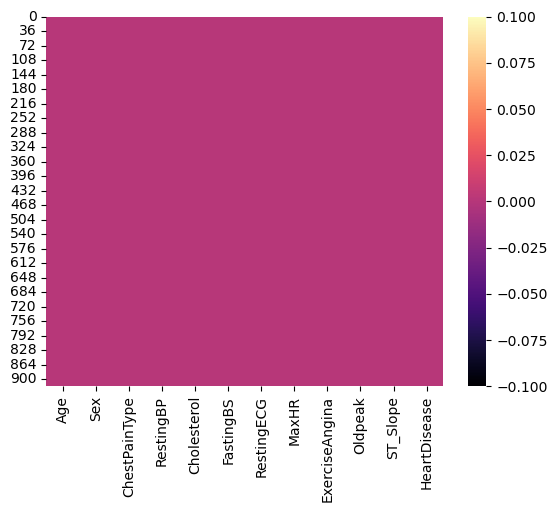

In [8]:
sns.heatmap(data.isnull(), cmap= 'magma', cbar ='False')

In [9]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,918.00,53.51,9.43,28.00,47.00,54.00,60.00,77.00
RestingBP,918.00,132.40,18.51,0.00,120.00,130.00,140.00,200.00
Cholesterol,918.00,198.80,109.38,0.00,173.25,223.00,267.00,603.00
FastingBS,918.00,0.23,0.42,0.00,0.00,0.00,0.00,1.00
MaxHR,918.00,136.81,25.46,60.00,120.00,138.00,156.00,202.00
Oldpeak,918.00,0.89,1.07,-2.60,0.00,0.60,1.50,6.20
HeartDisease,918.00,0.55,0.50,0.00,0.00,1.00,1.00,1.00


In [10]:
data

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.00,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.00,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.00,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.50,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.00,Up,0
...,...,...,...,...,...,...,...,...,...,...,...,...
913,45,M,TA,110,264,0,Normal,132,N,1.20,Flat,1
914,68,M,ASY,144,193,1,Normal,141,N,3.40,Flat,1
915,57,M,ASY,130,131,0,Normal,115,Y,1.20,Flat,1
916,57,F,ATA,130,236,0,LVH,174,N,0.00,Flat,1


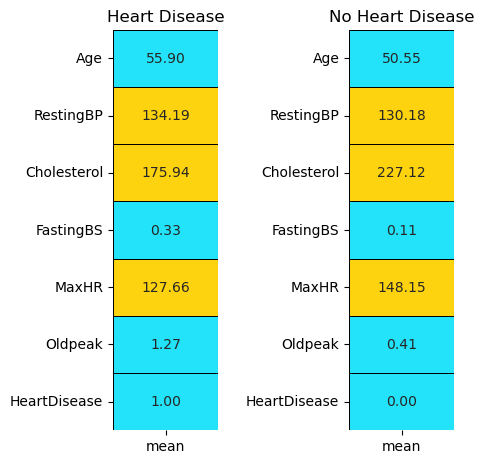

In [11]:
yes = data[data['HeartDisease'] == 1].describe().T
no = data[data['HeartDisease'] == 0].describe().T
colors = ['#22e3f9','#FDD20E']

fig,ax = plt.subplots(nrows = 1,ncols = 2,figsize = (5,5))
plt.subplot(1,2,1)
sns.heatmap(yes[['mean']],annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black',cbar = False,fmt = '.2f',)
plt.title('Heart Disease');

plt.subplot(1,2,2)
sns.heatmap(no[['mean']],annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black',cbar = False,fmt = '.2f')
plt.title('No Heart Disease');

fig.tight_layout(pad = 2)

In [12]:
col = list(data.columns)
categorical_features = []
numerical_features = []
for i in col:
    if len(data[i].unique()) > 6:
        numerical_features.append(i)
    else:
        categorical_features.append(i)

print('Categorical Features :',*categorical_features)
print('Numerical Features :',*numerical_features)

Categorical Features : Sex ChestPainType FastingBS RestingECG ExerciseAngina ST_Slope HeartDisease
Numerical Features : Age RestingBP Cholesterol MaxHR Oldpeak


# CATEGORICAL

In [13]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df1 = data.copy(deep = True)

df1['Sex'] = le.fit_transform(df1['Sex'])
df1['ChestPainType'] = le.fit_transform(df1['ChestPainType'])
df1['RestingECG'] = le.fit_transform(df1['RestingECG'])
df1['ExerciseAngina'] = le.fit_transform(df1['ExerciseAngina'])
df1['ST_Slope'] = le.fit_transform(df1['ST_Slope'])

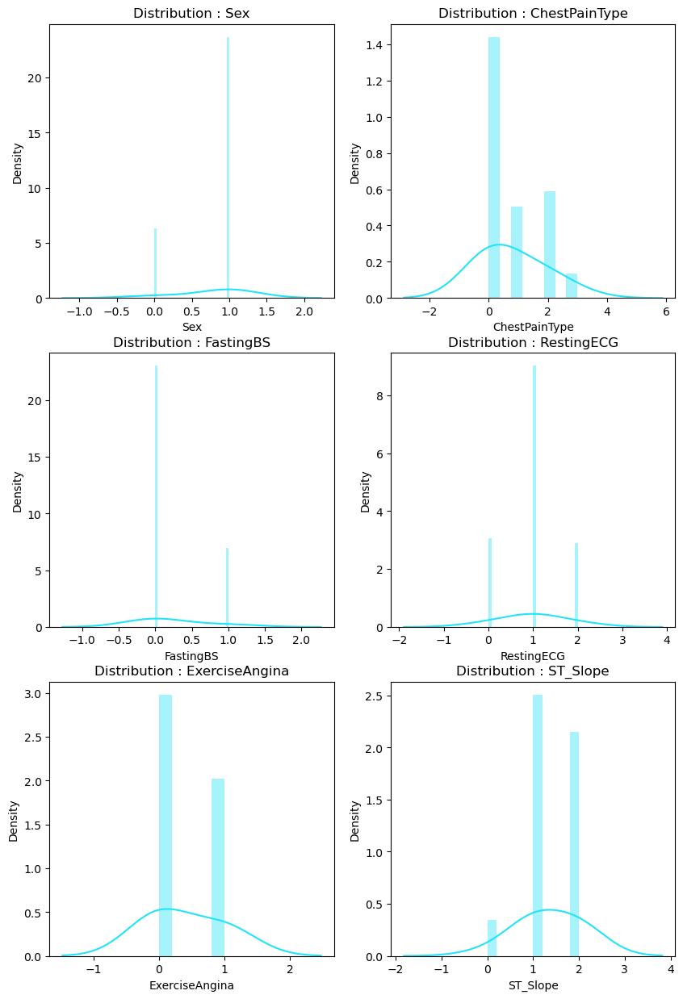

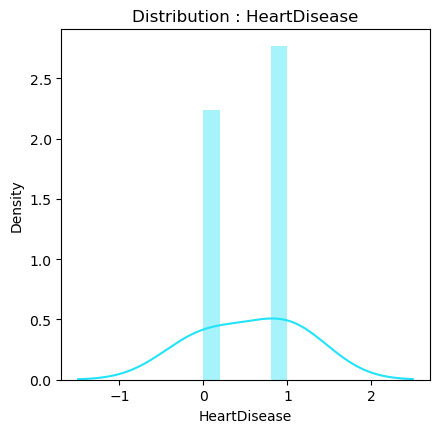

In [14]:
fig, ax = plt.subplots(nrows = 3,ncols = 2,figsize = (10,15))
for i in range(len(categorical_features) - 1):
    
    plt.subplot(3,2,i+1)
    sns.distplot(df1[categorical_features[i]],kde_kws = {'bw' : 1},color = colors[0]);
    title = 'Distribution : ' + categorical_features[i]
    plt.title(title)
    
plt.figure(figsize = (4.75,4.55))
sns.distplot(df1[categorical_features[len(categorical_features) - 1]],kde_kws = {'bw' : 1},color = colors[0])
title = 'Distribution : ' + categorical_features[len(categorical_features) - 1]
plt.title(title);

# NUMERICAL

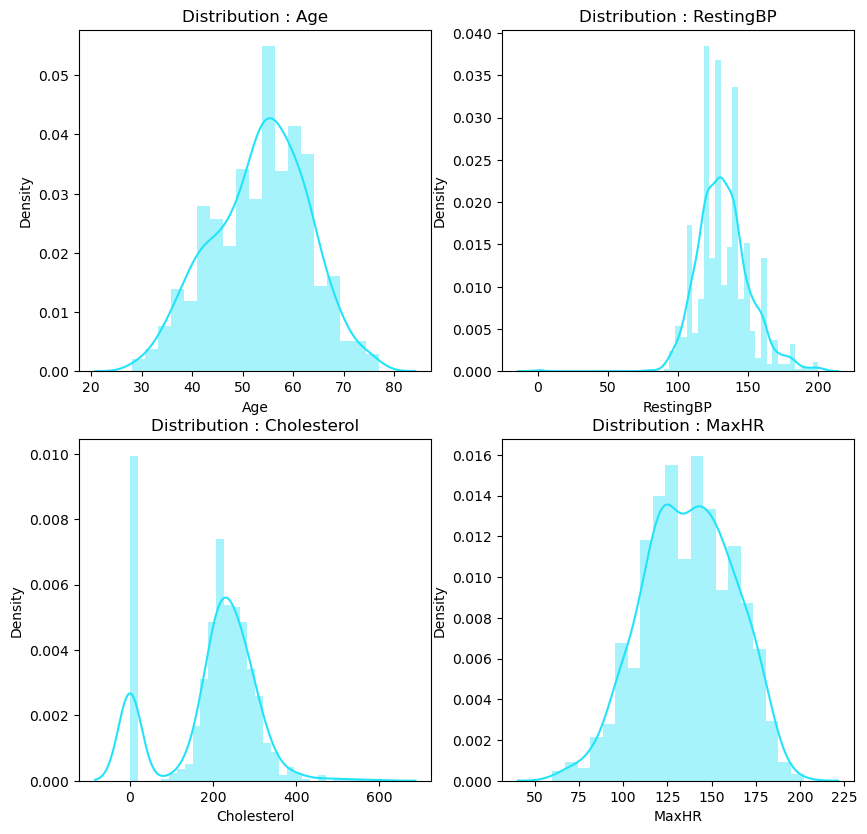

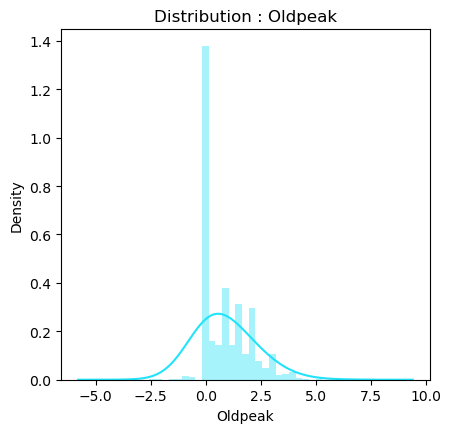

In [15]:
fig, ax = plt.subplots(nrows = 2,ncols = 2,figsize = (10,9.75))
for i in range(len(numerical_features) - 1):
    plt.subplot(2,2,i+1)
    sns.distplot(data[numerical_features[i]],color = colors[0])
    title = 'Distribution : ' + numerical_features[i]
    plt.title(title)
plt.show()

plt.figure(figsize = (4.75,4.55))
sns.distplot(df1[numerical_features[len(numerical_features) - 1]],kde_kws = {'bw' : 1},color = colors[0])
title = 'Distribution : ' + numerical_features[len(numerical_features) - 1]
plt.title(title);

In [16]:
data

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.00,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.00,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.00,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.50,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.00,Up,0
...,...,...,...,...,...,...,...,...,...,...,...,...
913,45,M,TA,110,264,0,Normal,132,N,1.20,Flat,1
914,68,M,ASY,144,193,1,Normal,141,N,3.40,Flat,1
915,57,M,ASY,130,131,0,Normal,115,Y,1.20,Flat,1
916,57,F,ATA,130,236,0,LVH,174,N,0.00,Flat,1


# vizualitation 1

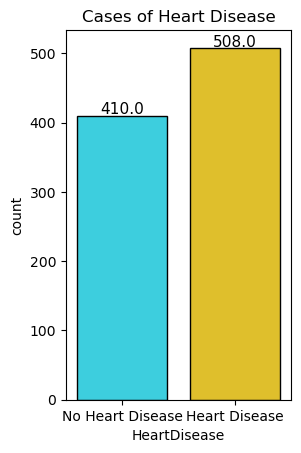

In [17]:
l = list(data['HeartDisease'].value_counts())
circle = [l[1] / sum(l) * 100,l[0] / sum(l) * 100]

plt.subplot(1,2,2)
ax = sns.countplot(x='HeartDisease', data=data, palette=colors, edgecolor='black')
for rect in ax.patches:
    ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(), horizontalalignment='center', fontsize=11)
ax.set_xticklabels(['No Heart Disease', 'Heart Disease'])
plt.title('Cases of Heart Disease')
plt.show()

In [18]:
sex = data[data['HeartDisease'] == 1]['Sex'].value_counts()
sex = [sex[0] / sum(sex) * 100, sex[1] / sum(sex) * 100]

cp = data[data['HeartDisease'] == 1]['ChestPainType'].value_counts()
cp = [cp[0] / sum(cp) * 100,cp[1] / sum(cp) * 100,cp[2] / sum(cp) * 100,cp[3] / sum(cp) * 100]

fbs = data[data['HeartDisease'] == 1]['FastingBS'].value_counts()
fbs = [fbs[0] / sum(fbs) * 100,fbs[1] / sum(fbs) * 100]

restecg = data[data['HeartDisease'] == 1]['RestingECG'].value_counts()
restecg = [restecg[0] / sum(restecg) * 100,restecg[1] / sum(restecg) * 100,restecg[2] / sum(restecg) * 100]

exang = data[data['HeartDisease'] == 1]['ExerciseAngina'].value_counts()
exang = [exang[0] / sum(exang) * 100,exang[1] / sum(exang) * 100]

slope = data[data['HeartDisease'] == 1]['ST_Slope'].value_counts()
slope = [slope[0] / sum(slope) * 100,slope[1] / sum(slope) * 100,slope[2] / sum(slope) * 100]

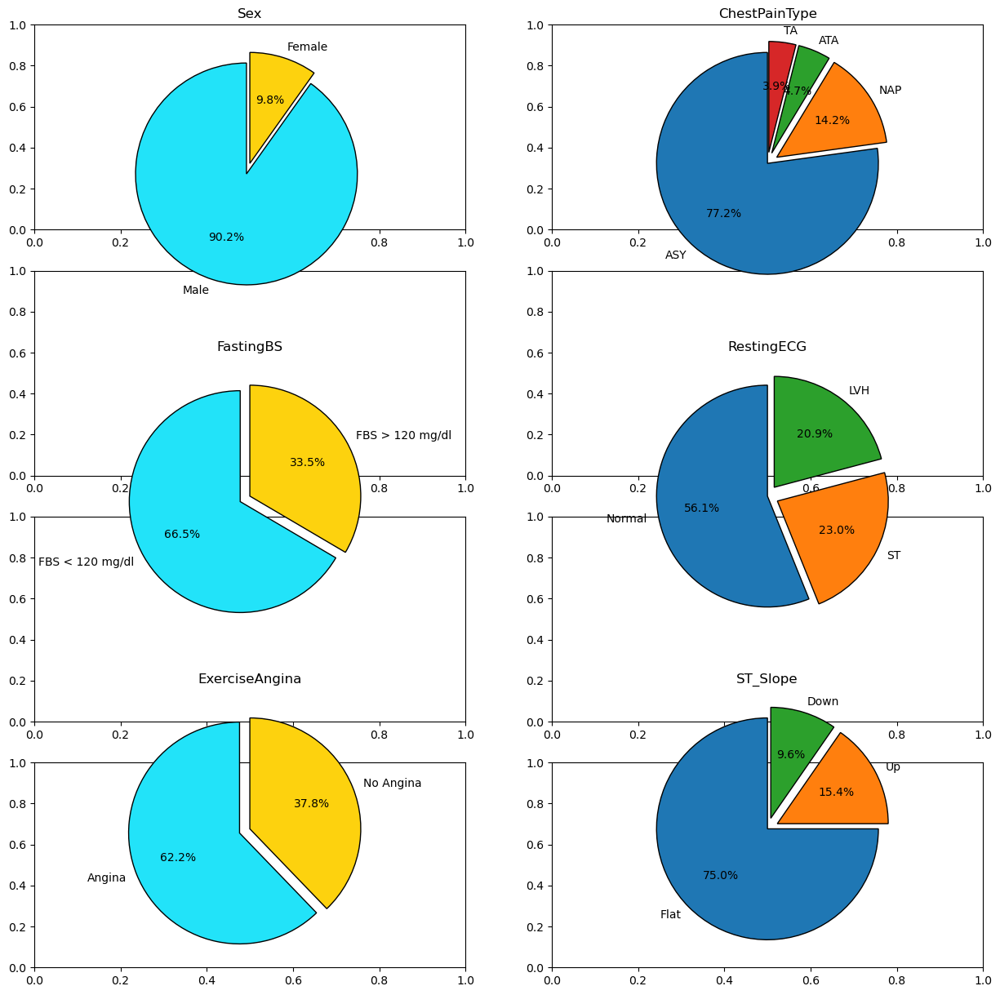

In [19]:
ax,fig = plt.subplots(nrows = 4,ncols = 2,figsize = (15,15))

plt.subplot(3,2,1)
plt.pie(sex,labels = ['Male','Female'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = colors,
        wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Sex');

plt.subplot(3,2,2)
plt.pie(cp,labels = ['ASY', 'NAP', 'ATA', 'TA'],autopct='%1.1f%%',startangle = 90,explode = (0,0.1,0.1,0.1),
        wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('ChestPainType');

plt.subplot(3,2,3)
plt.pie(fbs,labels = ['FBS < 120 mg/dl','FBS > 120 mg/dl'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = colors,
        wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('FastingBS');

plt.subplot(3,2,4)
plt.pie(restecg,labels = ['Normal','ST','LVH'],autopct='%1.1f%%',startangle = 90,explode = (0,0.1,0.1),
        wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('RestingECG');

plt.subplot(3,2,5)
plt.pie(exang,labels = ['Angina','No Angina'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = colors,
        wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('ExerciseAngina');

plt.subplot(3,2,6)
plt.pie(slope,labels = ['Flat','Up','Down'],autopct='%1.1f%%',startangle = 90,explode = (0,0.1,0.1),
        wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('ST_Slope');

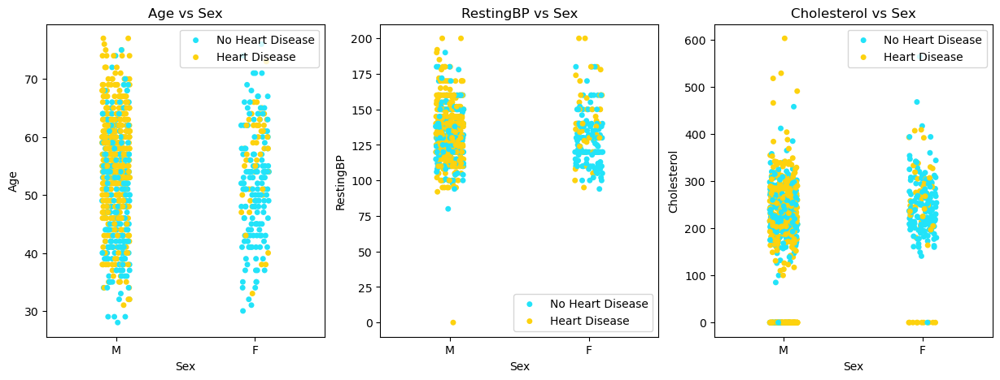

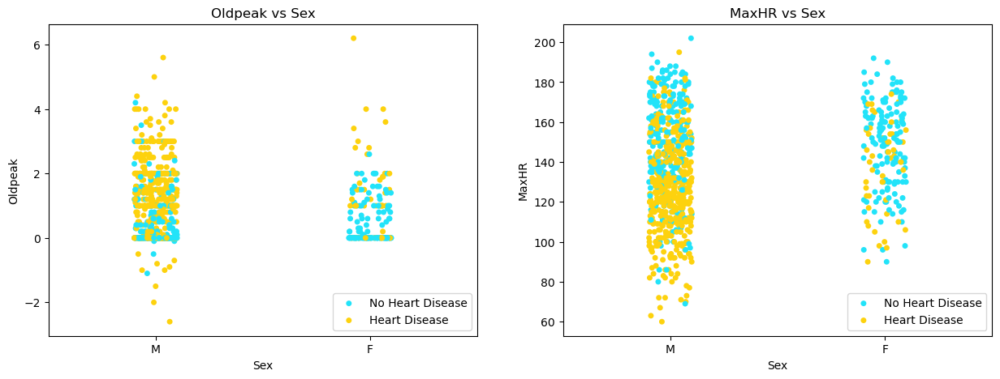

In [20]:
fig,ax = plt.subplots(nrows = 1,ncols = 3,figsize = (15,5))
for i in range(3):
    plt.subplot(1,3,i+1)
    sns.stripplot(x = 'Sex',y = numerical_features[i],data = data,hue = 'HeartDisease',palette = colors);
    plt.legend(['No Heart Disease', 'Heart Disease'])
    title = numerical_features[i] + ' vs Sex' 
    plt.title(title);

fig,ax = plt.subplots(nrows = 1,ncols = 2,figsize = (15,5))
for i in [-1,-2]:
    plt.subplot(1,2,-i)
    sns.stripplot(x = 'Sex',y = numerical_features[i],data = data,hue = 'HeartDisease',palette = colors);
    plt.legend(['No Heart Disease', 'Heart Disease'])
    title = numerical_features[i] + ' vs Sex' 
    plt.title(title);

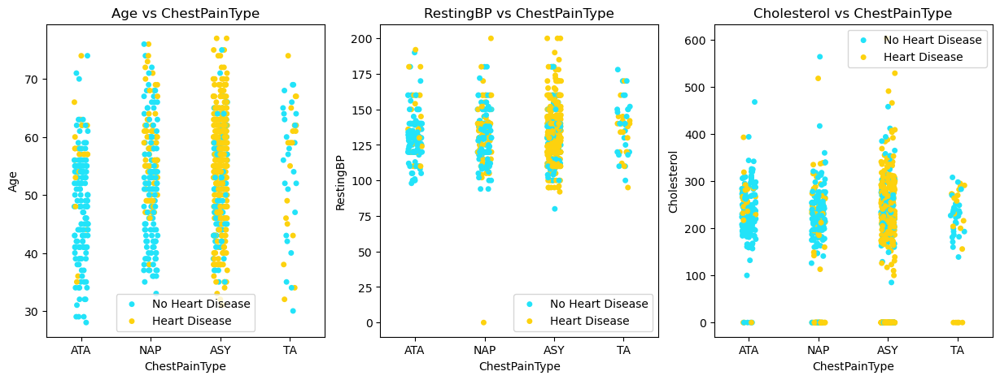

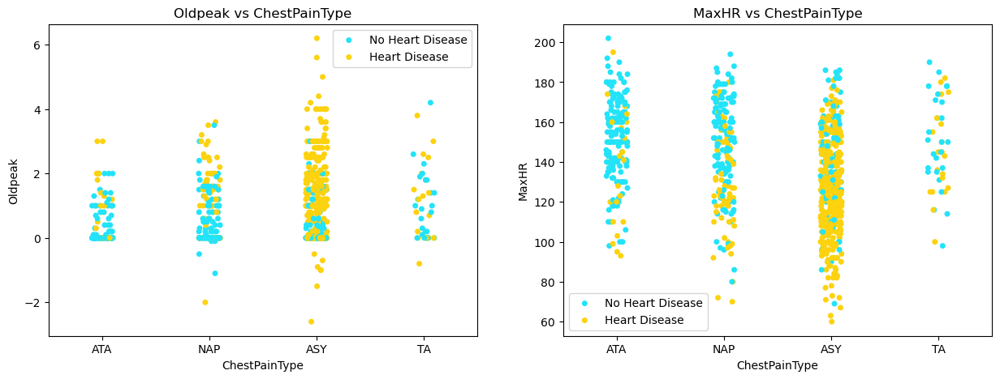

In [21]:
fig,ax = plt.subplots(nrows = 1,ncols = 3,figsize = (15,5))
for i in range(3):
    plt.subplot(1,3,i+1)
    sns.stripplot(x = 'ChestPainType',y = numerical_features[i],data = data,hue = 'HeartDisease',palette = colors);
    plt.legend(['No Heart Disease', 'Heart Disease'])
    title = numerical_features[i] + ' vs ChestPainType'
    plt.title(title);

fig,ax = plt.subplots(nrows = 1,ncols = 2,figsize = (15,5))
for i in [-1,-2]:
    plt.subplot(1,2,-i)
    sns.stripplot(x = 'ChestPainType',y = numerical_features[i],data = data,hue = 'HeartDisease',palette = colors);
    plt.legend(['No Heart Disease', 'Heart Disease'])
    title = numerical_features[i] + ' vs ChestPainType' 
    plt.title(title);

In [22]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler
mms = MinMaxScaler() # Normalization
ss = StandardScaler() # Standardization

df1['Oldpeak'] = mms.fit_transform(df1[['Oldpeak']])
df1['Age'] = ss.fit_transform(df1[['Age']])
df1['RestingBP'] = ss.fit_transform(df1[['RestingBP']])
df1['Cholesterol'] = ss.fit_transform(df1[['Cholesterol']])
df1['MaxHR'] = ss.fit_transform(df1[['MaxHR']])
df1.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,-1.43,1,1,0.41,0.83,0,1,1.38,0,0.30,2,0
1,-0.48,0,2,1.49,-0.17,0,1,0.75,0,0.41,1,1
2,-1.75,1,1,-0.13,0.77,0,2,-1.53,0,0.30,2,0
3,-0.58,0,0,0.30,0.14,0,1,-1.13,1,0.47,1,1
4,0.05,1,2,0.95,-0.03,0,1,-0.58,0,0.30,2,0


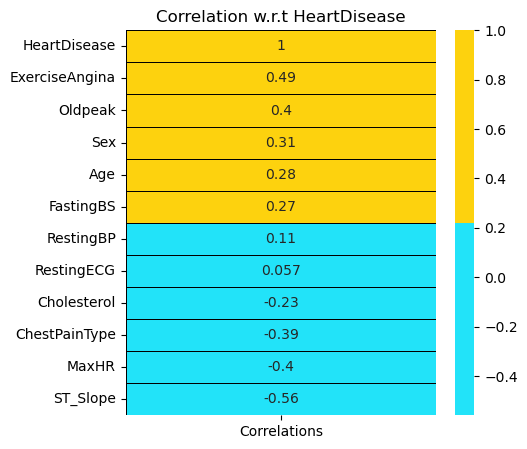

In [23]:
corr = df1.corrwith(df1['HeartDisease']).sort_values(ascending = False).to_frame()
corr.columns = ['Correlations']
plt.subplots(figsize = (5,5))
sns.heatmap(corr,annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black');
plt.title('Correlation w.r.t HeartDisease');

# CHI SQUARE

In [24]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

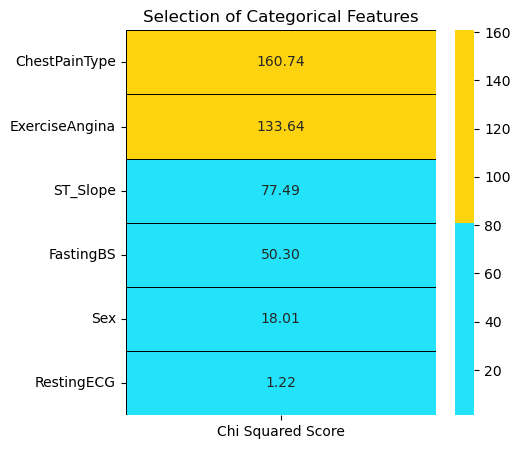

In [25]:
features = df1.loc[:,categorical_features[:-1]]
target = df1.loc[:,categorical_features[-1]]

best_features = SelectKBest(score_func = chi2,k = 'all')
fit = best_features.fit(features,target)

featureScores = pd.DataFrame(data = fit.scores_,index = list(features.columns),columns = ['Chi Squared Score']) 

plt.subplots(figsize = (5,5))
sns.heatmap(featureScores.sort_values(ascending = False,by = 'Chi Squared Score'),annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black',fmt = '.2f');
plt.title('Selection of Categorical Features');

Except RestingECG, all the remaining categorical features are pretty important for predicting heart diseases.

# ANOVA

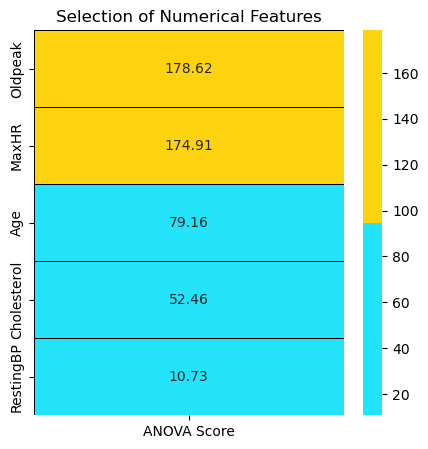

In [26]:
from sklearn.feature_selection import f_classif

features = df1.loc[:,numerical_features]
target = df1.loc[:,categorical_features[-1]]

best_features = SelectKBest(score_func = f_classif,k = 'all')
fit = best_features.fit(features,target)

featureScores = pd.DataFrame(data = fit.scores_,index = list(features.columns),columns = ['ANOVA Score']) 

plt.subplots(figsize = (5,5))
sns.heatmap(featureScores.sort_values(ascending = False,by = 'ANOVA Score'),annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black',fmt = '.2f');
plt.title('Selection of Numerical Features');

We will leave out RestingBP from the modeling part and take the remaining features.

# visualisasi 2

In [27]:
df = pd.read_csv('HEART.csv')

df.loc[df['HeartDisease'] == 1, 'HeartDisease'] = 'ill' 
df.loc[df['HeartDisease'] == 0, 'HeartDisease'] = 'healthy'
df.loc[df['Sex'] == 'M', 'Sex'] = 'male'
df.loc[df['Sex'] == 'F', 'Sex'] = 'female'
df.loc[df['ExerciseAngina'] == 'Y', 'ExerciseAngina'] = 'yes'
df.loc[df['ExerciseAngina'] == 'N', 'ExerciseAngina'] = 'no'

df = df.rename(columns = {'ChestPainType':'Chest Pain Type', 
                          'RestingBP':'Resting BP', 
                          'FastingBS':'Fasting BS',
                          'RestingECG':'Resting ECG',
                          'MaxHR':'Max HR',
                          'ExerciseAngina':'Exercise Angina',
                          'ST_Slope':'ST Slope',
                          'HeartDisease':'Heart Disease'})

### Initial parameters for plots

sns.set_theme(rc = {'grid.linewidth': 0.6, 'grid.color': 'white',
                    'axes.linewidth': 2, 'axes.facecolor': '#ECECEC', 
                    'axes.labelcolor': '#000000',
                    'figure.facecolor': '#f7f7f7',
                    'xtick.color': '#000000', 'ytick.color': '#000000'})

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Age              918 non-null    int64  
 1   Sex              918 non-null    object 
 2   Chest Pain Type  918 non-null    object 
 3   Resting BP       918 non-null    int64  
 4   Cholesterol      918 non-null    int64  
 5   Fasting BS       918 non-null    int64  
 6   Resting ECG      918 non-null    object 
 7   Max HR           918 non-null    int64  
 8   Exercise Angina  918 non-null    object 
 9   Oldpeak          918 non-null    float64
 10  ST Slope         918 non-null    object 
 11  Heart Disease    918 non-null    object 
dtypes: float64(1), int64(5), object(6)
memory usage: 86.2+ KB


In [29]:
df

,Age,Sex,Chest Pain Type,Resting BP,Cholesterol,Fasting BS,Resting ECG,Max HR,Exercise Angina,Oldpeak,ST Slope,Heart Disease
0,40,male,ATA,140,289,0,Normal,172,no,0.00,Up,healthy
1,49,female,NAP,160,180,0,Normal,156,no,1.00,Flat,ill
2,37,male,ATA,130,283,0,ST,98,no,0.00,Up,healthy
3,48,female,ASY,138,214,0,Normal,108,yes,1.50,Flat,ill
4,54,male,NAP,150,195,0,Normal,122,no,0.00,Up,healthy
...,...,...,...,...,...,...,...,...,...,...,...,...
913,45,male,TA,110,264,0,Normal,132,no,1.20,Flat,ill
914,68,male,ASY,144,193,1,Normal,141,no,3.40,Flat,ill
915,57,male,ASY,130,131,0,Normal,115,yes,1.20,Flat,ill
916,57,female,ATA,130,236,0,LVH,174,no,0.00,Flat,ill


In [30]:
Cat_vars = []
Num_vars = []

for col in list(df.columns):
    if ((df[col].dtype == 'float64') | (df[col].dtype == 'int64')) & (df[col].nunique() > 10):
        Num_vars.append(col)
    
    else: Cat_vars.append(col)

Cat_vars.remove('Heart Disease')

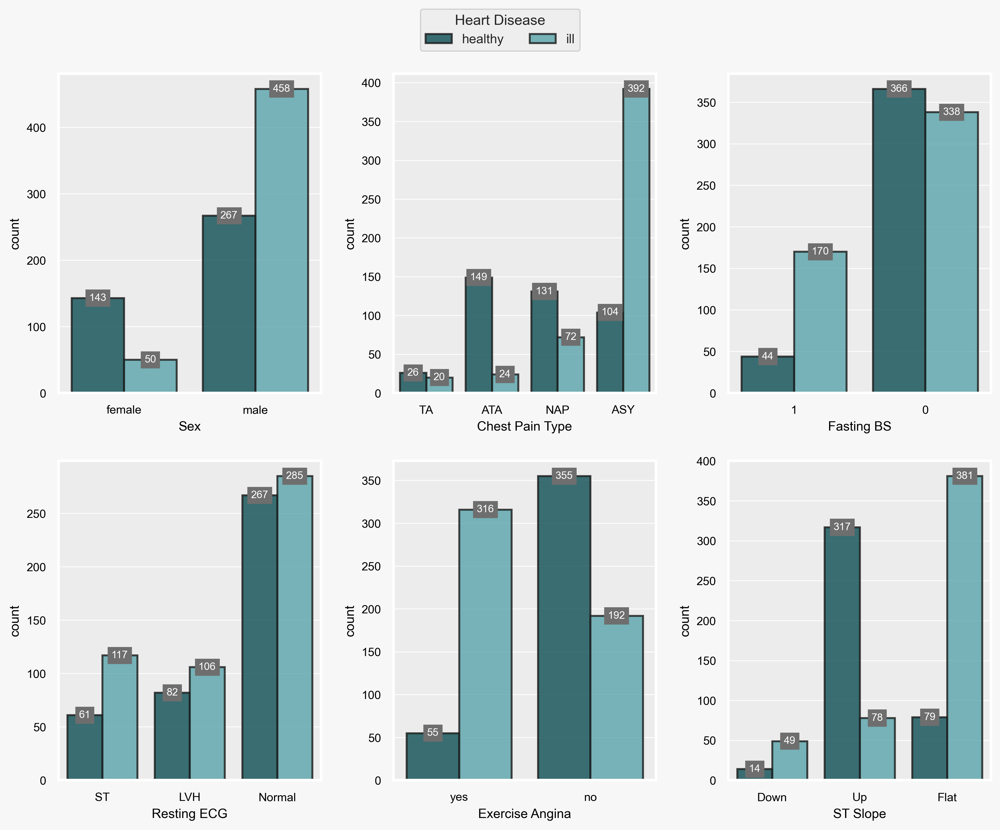

In [31]:
my_palette = ['#00575e', '#4bafb8']

with plt.rc_context(rc = {'figure.dpi': 350, 'axes.labelsize': 10, 
                          'xtick.labelsize': 9, 'ytick.labelsize': 9}):

    fig_1, ax_1 = plt.subplots(2, 3, figsize = (11, 8.5))
    
    for idx, (column, axes) in list(enumerate(zip(Cat_vars, ax_1.flatten()))):
        
        order = df.groupby(column).size().sort_values(ascending = True).index.tolist()
    
        cplot = sns.countplot(ax = axes, x = df[column], hue = df['Heart Disease'],
                              order = order, linewidth = 1.5,
                              edgecolor = 'k', palette = my_palette, alpha = 0.8)
        
        axes.get_legend().remove()
        
        for p in cplot.patches:
        
            cplot.annotate(format(p.get_height(), '.0f'), 
                           (p.get_x() + p.get_width() / 2, p.get_height()), 
                           ha = 'center', va = 'center', size = 8, color = 'w',
                           bbox = dict(boxstyle = 'square, pad = 0.3', 
                           fc = '#6e6e6e', lw = 1, ec = '#6e6e6e'))
    
    else:
    
        [axes.set_visible(False) for axes in ax_1.flatten()[idx + 1:]]
    
    ### A global legend
    
    handles, labels = axes.get_legend_handles_labels()
    fig_1.legend(handles, labels, loc = 'upper center', 
                 bbox_to_anchor = (0.5, 1.06), ncol = 2, fontsize = 10,
                 title = 'Heart Disease', title_fontsize = 11)        

    plt.tight_layout(pad = 1.5)
    plt.show()

In [32]:
#Numeric Variables
df[Num_vars].describe().T.round(1)

,count,mean,std,min,25%,50%,75%,max
Age,918.00,53.50,9.40,28.00,47.00,54.00,60.00,77.00
Resting BP,918.00,132.40,18.50,0.00,120.00,130.00,140.00,200.00
Cholesterol,918.00,198.80,109.40,0.00,173.20,223.00,267.00,603.00
Max HR,918.00,136.80,25.50,60.00,120.00,138.00,156.00,202.00
Oldpeak,918.00,0.90,1.10,-2.60,0.00,0.60,1.50,6.20


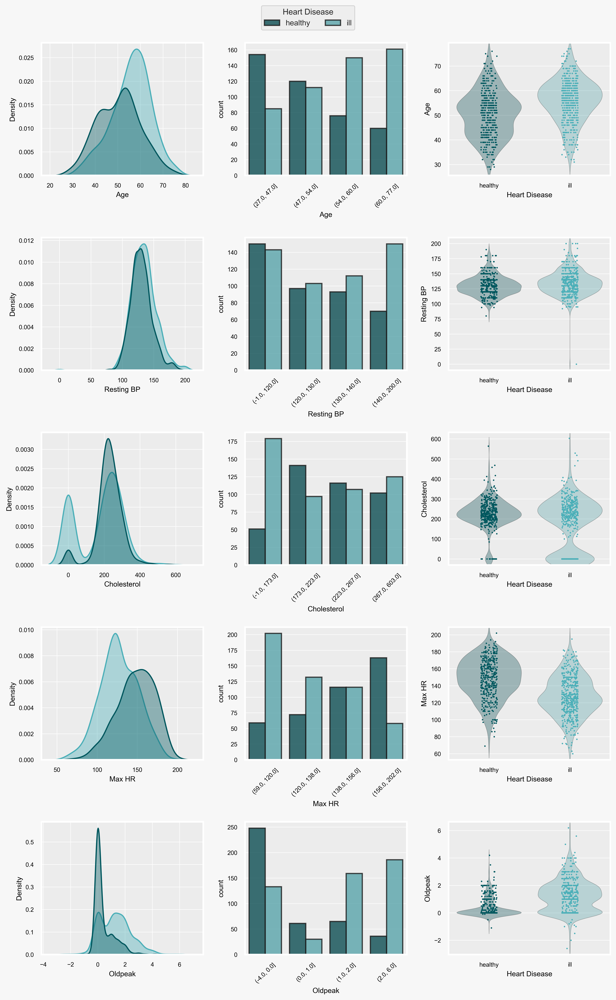

In [33]:
with plt.rc_context(rc = {'figure.dpi': 500, 'axes.labelsize': 9, 
                          'xtick.labelsize': 7.5, 'ytick.labelsize': 7.5}):

    fig_2, ax_2 = plt.subplots(5, 3, figsize = (11, 17))
    
    col_no = 0

    for column in Num_vars:
        
        ### KDE plots
    
        sns.kdeplot(ax = ax_2[col_no, 0], x = df[column], 
                    hue = df['Heart Disease'],
                    common_norm = True,
                    fill = True, alpha = 0.4, palette = my_palette,
                    linewidth = 1.5)
        
        ax_2[col_no, 0].get_legend().remove()
        
        ### Quantile-based discretization
        
        cuts = pd.qcut(df[column], 4, precision = 0)
        
        sns.countplot(ax = ax_2[col_no, 1], x = cuts, 
                      hue = df['Heart Disease'], 
                      linewidth = 1.5, edgecolor = 'k', 
                      palette = my_palette, alpha = 0.8)
        
        ax_2[col_no, 1].get_legend().remove()
        
        plt.setp(ax_2[col_no, 1].get_xticklabels(), rotation = 45)
        
        #### Violinplots & stripplots
        
        sns.violinplot(ax = ax_2[col_no, 2], x = df['Heart Disease'], 
                       y = df[column], palette = my_palette, scale = 'width',
                       linewidth = 0.5, inner = None)
        
        plt.setp(ax_2[col_no, 2].collections, alpha = 0.35)
        
        sns.stripplot(ax = ax_2[col_no, 2], x = df['Heart Disease'], 
                      y = df[column], palette = my_palette, alpha = 1,
                      s = 1.8, jitter = 0.1)
        col_no += 1
    
    ### A global legend
    
    handles, labels = ax_2[4, 1].get_legend_handles_labels()
    fig_2.legend(handles, labels, loc = 'upper center', 
                 bbox_to_anchor = (0.5, 1.027), ncol = 2, 
                 fontsize = 9.5, title = 'Heart Disease', title_fontsize = 10)
    
    plt.tight_layout(pad = 1.5)
    plt.show()

# eksplorasi data

In [34]:
## Categorical feature selection Variables

Combinations = []

for num in ["Age","Resting BP", "Cholesterol", "Max HR", "Heart Disease"]:
    for cat in ["Sex","Oldpeak"]:
                Combinations.append([num] + [cat])

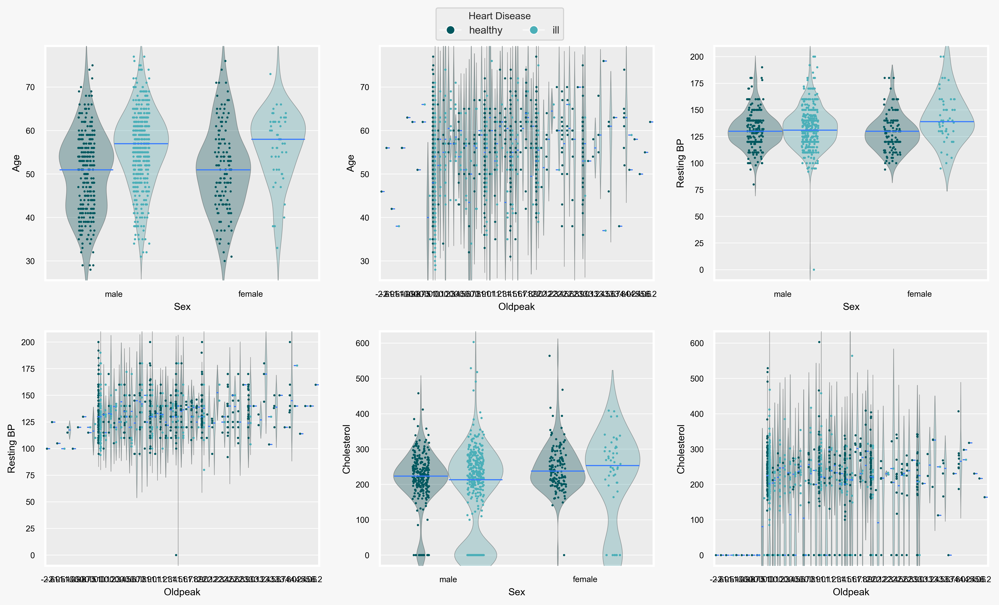

In [35]:
from matplotlib.lines import Line2D
with plt.rc_context(rc = {'figure.dpi': 500, 'axes.labelsize': 9, 
                          'xtick.labelsize': 7.5, 'ytick.labelsize': 7.5}):

    fig_3, ax_3 = plt.subplots(2, 3, figsize = (13, 7.5))

    for idx, ((y, x), axes) in list(enumerate(zip(Combinations, ax_3.flatten()))):

        sns.violinplot(ax = axes, x = df[x], 
                       y = df[y], hue = df['Heart Disease'],
                       scale = 'width', inner = None,
                       linewidth = 0.5, palette = my_palette)
        
        plt.setp(axes.collections, alpha = 0.35)
    
        sns.stripplot(ax = axes, x = df[x], dodge = True,
                      y = df[y], hue = df['Heart Disease'],
                      palette = my_palette, s = 2, alpha = 1,
                      jitter = 0.12)
        
        sns.boxplot(ax = axes, y = df[y], 
                    x = df[x], hue = df['Heart Disease'],
                    showmeans = False, meanline = False, zorder = 10,
                    meanprops = {'visible': True},
                    medianprops = {'color': '#387aff', 'linestyle': '-', 'lw': 1},
                    whiskerprops = {'visible': False},
                    showfliers = False, showbox = False, showcaps = False)
        
        axes.get_legend().remove()
    
        plt.setp(axes.lines, zorder = 100)
        plt.setp(axes.collections, zorder = 100)
    
    ### A global legend
    
    healthy = Line2D([0], [0], marker = 'o', color = '#f7f7f7', label = 'healthy',
                        markerfacecolor = '#00575e', markersize = 8)
    
    ill = Line2D([0], [0], marker = 'o', color = '#f7f7f7', label = 'ill',
                        markerfacecolor = '#4bafb8', markersize = 8)
    
    fig_3.legend(handles = [healthy, ill],
                 loc = 'upper center', bbox_to_anchor = (0.5, 1.04), ncol = 2, 
                 fontsize = 9.5, title = 'Heart Disease', title_fontsize = 9)  
    
    plt.tight_layout(pad = 1.5)
    plt.show()

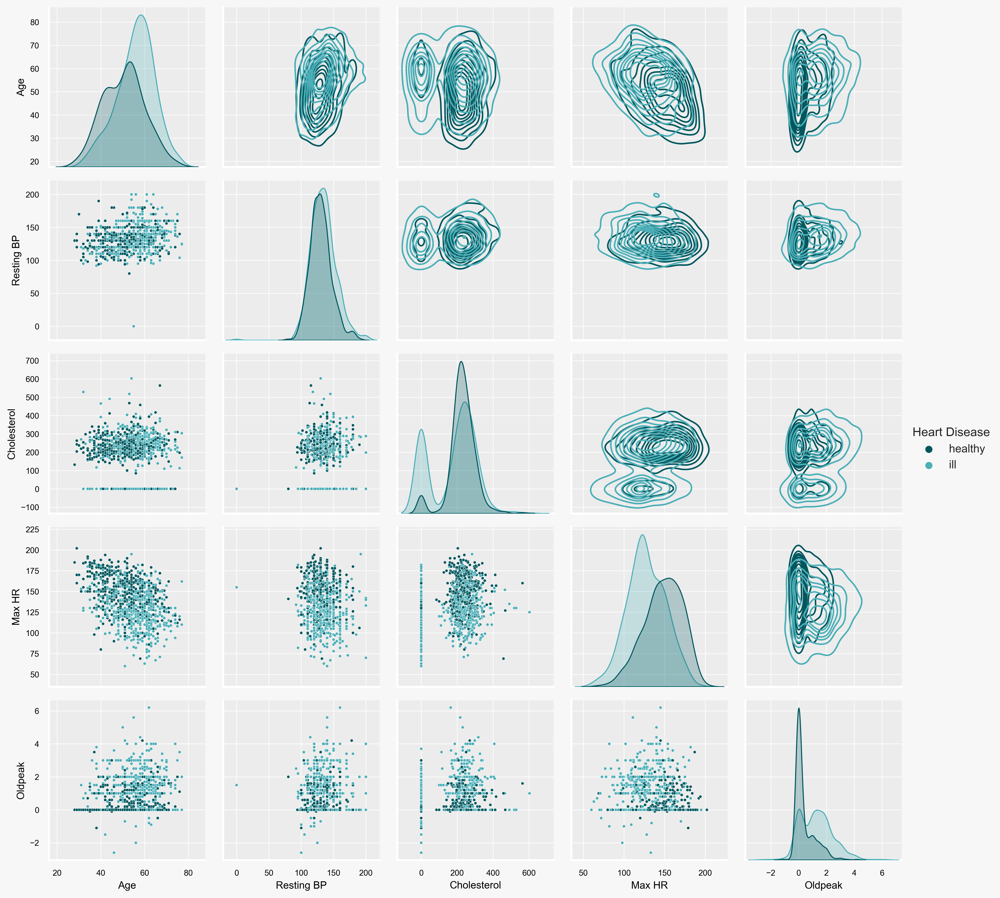

In [36]:
# Numeric variables
Num_vars_target = Num_vars.copy()
Num_vars_target.append('Heart Disease')

with plt.rc_context(rc = {'figure.dpi': 400, 'axes.labelsize': 10, 
                          'xtick.labelsize': 8, 'ytick.labelsize': 8}):
    
    fig_4 = sns.PairGrid(df[Num_vars_target], diag_sharey = False,
                         hue = 'Heart Disease', palette = my_palette)
    
    fig_4.map_lower(sns.scatterplot, s = 8)
    
    fig_4.add_legend()
    
    fig_4.map_upper(sns.kdeplot)
    fig_4.map_diag(sns.kdeplot, fill = True)
    
    plt.show()

# PCA dengan Clustering

# PCA

In [37]:
from sklearn.decomposition import PCA

def PCA_(df, Vars_list, n_components = 10):
    
    ### Scaling data
    
    scaler = StandardScaler()
    data_scaled = pd.DataFrame(scaler.fit_transform(df[Vars_list]), 
                               columns = df[Vars_list].columns)
    
    ### Initialising PCA
    
    pca = PCA(n_components = n_components)
    
    pca_fit = pca.fit(data_scaled)
    pca_transf = pca.transform(data_scaled)
    
    return pca_fit, pca_transf

PCA_results = PCA_(df, Num_vars, n_components = len(Num_vars))

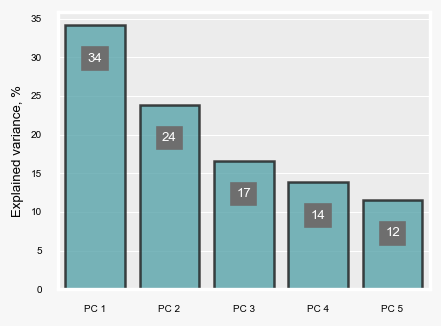

In [38]:
PCA_variance = pd.DataFrame({'Explained variance, %': 
                             PCA_results[0].explained_variance_ratio_*100})

with plt.rc_context(rc = {'figure.dpi': 120, 'axes.labelsize': 8, 
                          'xtick.labelsize': 6, 'ytick.labelsize': 6}):
    
    fig_5, ax_5 = plt.subplots(1, 1, figsize = (4, 3))

    bar = sns.barplot(x = ['PC ' + str(i) for i in range(1, 6)], 
                      y = PCA_variance['Explained variance, %'],
                      linewidth = 1.5, edgecolor = 'k', color = '#4bafb8', 
                      alpha = 0.8)
    
    ### Annotations
    
    for p in bar.patches:
        
        bar.annotate(format(p.get_height(), '.0f'), 
                     (p.get_x() + p.get_width() / 2, p.get_height()), 
                      ha = 'center', va = 'center', size = 8, color = 'w',
                      xytext = (0, -20), textcoords = 'offset points',
                      bbox = dict(boxstyle = 'square, pad = 0.4', 
                                  fc = '#6e6e6e', lw = 1, ec = '#6e6e6e'))
    
          
    plt.show()

In [39]:
pd.DataFrame(PCA_results[0].components_, columns = df[Num_vars].columns,
             index = ['PC 1', 'PC 2', 'PC 3', 'PC 4', 'PC 5']).round(2).T

,PC 1,PC 2,PC 3,PC 4,PC 5
Age,-0.60,-0.01,-0.08,0.32,0.73
Resting BP,-0.37,-0.47,-0.64,-0.43,-0.19
Cholesterol,0.18,-0.74,0.06,0.63,-0.13
Max HR,0.54,-0.34,0.04,-0.43,0.63
Oldpeak,-0.42,-0.32,0.76,-0.36,-0.11


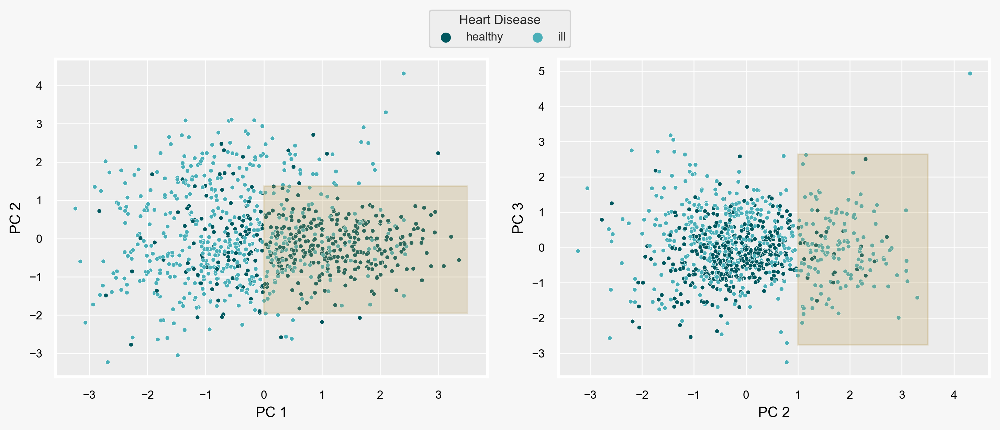

In [40]:
PCA_scores = pd.DataFrame(PCA_results[1], columns = ['PC 1', 'PC 2', 'PC 3', 'PC 4', 'PC 5'])

with plt.rc_context(rc = {'figure.dpi': 300, 'axes.labelsize': 10, 
                          'xtick.labelsize': 8, 'ytick.labelsize': 8, 
                          'legend.fontsize': 7, 'legend.title_fontsize': 8}):
    
    fig_6, ax_6 = plt.subplots(1, 2, figsize = (10, 4))
    
    ### PC 1 & PC 2
    
    sns.scatterplot(ax = ax_6[0], x = PCA_scores['PC 1'], y = PCA_scores['PC 2'], 
                    hue = df['Heart Disease'], palette = my_palette , s = 9)
    
    ax_6[0].get_legend().remove()
    
    ax_6[0].axvspan(xmin = 0, xmax = 3.5, 
                    ymin = 0.2, ymax = 0.6, 
                    alpha = 0.25, color = '#ba9e59')
    
    ### PC 2 & PC 3
    
    sns.scatterplot(ax = ax_6[1], x = PCA_scores['PC 2'], y = PCA_scores['PC 3'], 
                    hue = df['Heart Disease'], palette = my_palette, s = 9)
    
    ax_6[1].get_legend().remove()
    
    ax_6[1].axvspan(xmin = 1, xmax = 3.5, 
                    ymin = 0.1, ymax = 0.7, 
                    alpha = 0.25, color = '#ba9e59')
    
    ### A global legend
    
    handles, labels = ax_6[1].get_legend_handles_labels()
    fig_6.legend(handles, labels, loc = 'upper center', 
                 bbox_to_anchor = (0.5, 1.07), ncol = 2, 
                 fontsize = 8, title = 'Heart Disease', title_fontsize = 9)
    
    plt.tight_layout(pad = 1.5)
    plt.show()

# Clustering

# A gaussian mixture model

In [41]:
# membuat fitur yang ingin dianalisa saja
features  = ["Age","Sex","RestingBP", "Cholesterol", "MaxHR", "Oldpeak", "HeartDisease"]
data = data.dropna(subset=features)
df= data[features].copy()
df

,Age,Sex,RestingBP,Cholesterol,MaxHR,Oldpeak,HeartDisease
0,40,M,140,289,172,0.00,0
1,49,F,160,180,156,1.00,1
2,37,M,130,283,98,0.00,0
3,48,F,138,214,108,1.50,1
4,54,M,150,195,122,0.00,0
...,...,...,...,...,...,...,...
913,45,M,110,264,132,1.20,1
914,68,M,144,193,141,3.40,1
915,57,M,130,131,115,1.20,1
916,57,F,130,236,174,0.00,1


In [42]:
df['Sex'] = df['Sex'].replace(['M', 'F'], [0,1])
df.head()

,Age,Sex,RestingBP,Cholesterol,MaxHR,Oldpeak,HeartDisease
0,40,0,140,289,172,0.00,0
1,49,1,160,180,156,1.00,1
2,37,0,130,283,98,0.00,0
3,48,1,138,214,108,1.50,1
4,54,0,150,195,122,0.00,0


In [43]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Asumsikan data sudah dibaca ke dalam variabel `data`
# Menentukan fitur yang ingin dianalisis
features  = ["Age", "Sex", "RestingBP", "Cholesterol", "MaxHR", "Oldpeak", "HeartDisease"]

# Menghapus baris yang memiliki nilai NaN pada kolom yang dipilih
data = data.dropna(subset=features)

# Memilih kolom yang diinginkan saja
df = data[features].copy()

# Memisahkan data menjadi train (70%) dan test (30%)
train_df, test_df = train_test_split(df, test_size=0.30, random_state=42)


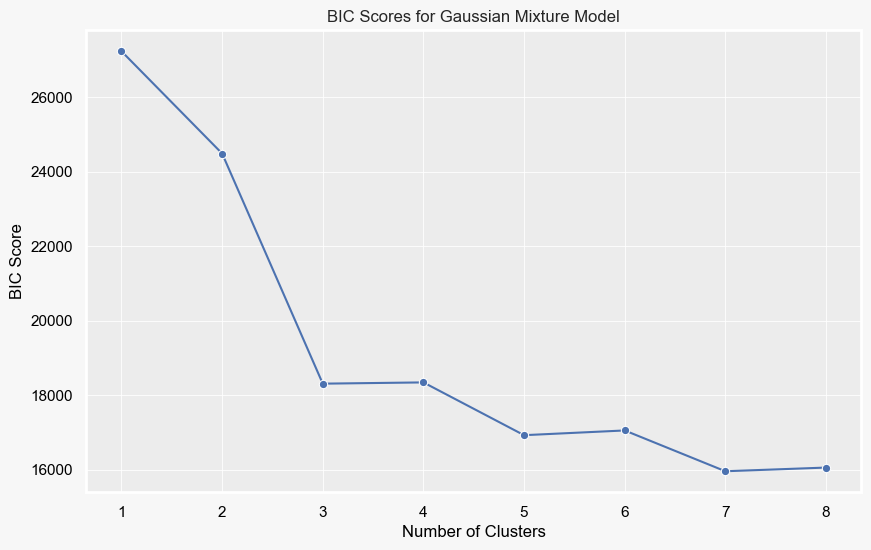

In [44]:
from sklearn.mixture import GaussianMixture
import numpy as np

train_df['Sex'] = train_df['Sex'].replace(['M', 'F'], [0,1])
train_df.head()

def Gaussian_mix_cluster_tuning(train_df, features, max_cluster=8):
    bic = []
    lowest_bic = np.infty
    n_components_range = range(1, max_cluster + 1)

    for n_components in n_components_range:
        gmm = GaussianMixture(n_components=n_components, covariance_type='full', random_state=42)
        gmm.fit(train_df[features])
        bic_score = gmm.bic(train_df[features])
        bic.append(bic_score)
        if bic_score < lowest_bic:
            lowest_bic = bic_score
            best_gmm = gmm
    
    return n_components_range, bic, best_gmm

# Menjalankan fungsi untuk mencari cluster terbaik
n_components_range, bic, best_gmm = Gaussian_mix_cluster_tuning(train_df, features)

# Membuat DataFrame untuk hasil tuning
Cluster_tuning_Gaussian_mix = pd.DataFrame({
    'Cluster': n_components_range,
    'BIC': bic
})

# Plotting BIC scores
plt.figure(figsize=(10, 6))
sns.lineplot(x='Cluster', y='BIC', data=Cluster_tuning_Gaussian_mix, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('BIC Score')
plt.title('BIC Scores for Gaussian Mixture Model')
plt.show()
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

In [45]:
train_df

,Age,Sex,RestingBP,Cholesterol,MaxHR,Oldpeak,HeartDisease
712,58,0,100,234,156,0.10,1
477,61,0,110,0,108,2.00,1
409,53,0,160,0,122,0.00,1
448,63,0,160,230,105,1.00,1
838,63,0,130,330,132,1.80,1
...,...,...,...,...,...,...,...
106,48,1,120,254,110,0.00,0
270,45,0,120,225,140,0.00,0
860,60,0,130,253,144,1.40,1
435,60,0,152,0,118,0.00,0


In [46]:
# Create and fit Gaussian Mixture Model with 4 components
Gaussian_model = GaussianMixture(n_components=4, covariance_type='full')
train_df['Gaussian_mixture'] = Gaussian_model.fit_predict(train_df[features])

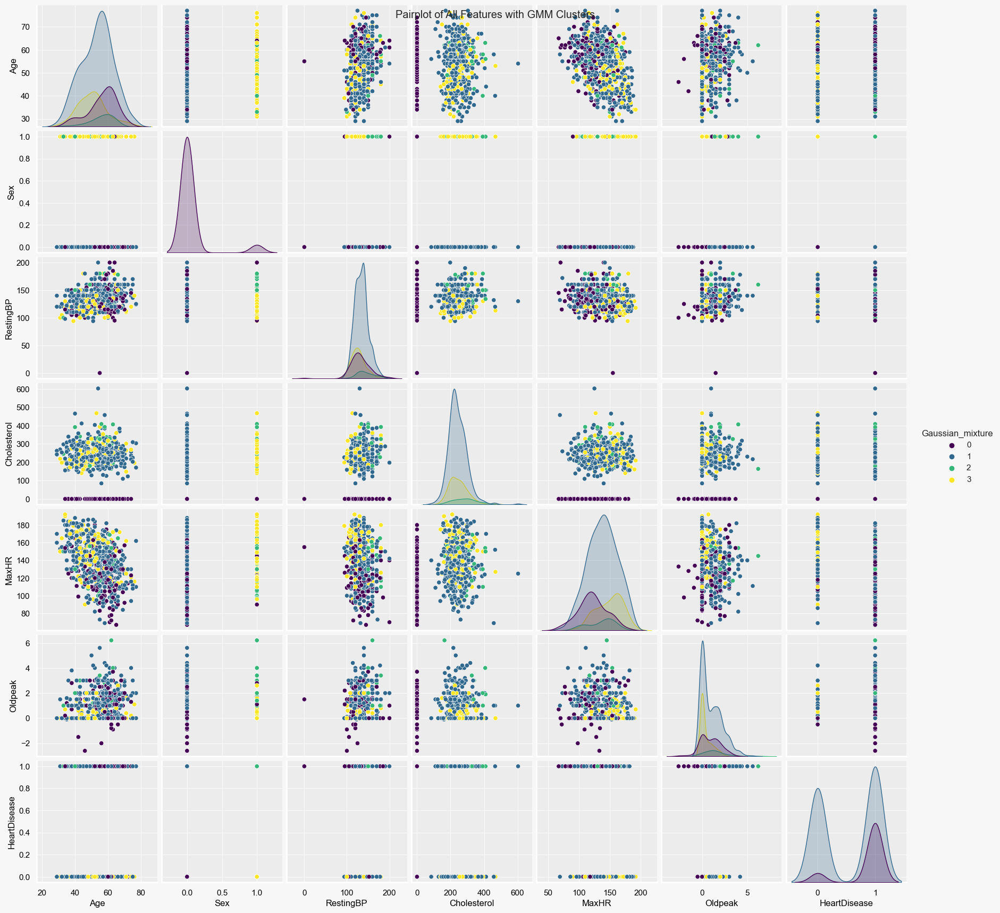

In [47]:
import seaborn as sns

# Create and fit Gaussian Mixture Model with 4 components
Gaussian_model = GaussianMixture(n_components=4, covariance_type='full')
train_df['Gaussian_mixture'] = Gaussian_model.fit_predict(train_df[features])

# Visualize the clusters for all features
sns.pairplot(train_df, hue='Gaussian_mixture', palette='viridis')
plt.suptitle('Pairplot of All Features with GMM Clusters')
plt.show()

In [48]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Calculate silhouette score
silhouette_avg_gmm = silhouette_score(train_df[features], train_df['Gaussian_mixture'])
print("Silhouette Score for GMM:", silhouette_avg_gmm)

# Calculate Calinski-Harabaz score
ch_score_gmm = calinski_harabasz_score(train_df[features], train_df['Gaussian_mixture'])
print("Calinski-Harabasz Score for GMM:", ch_score_gmm)


Silhouette Score for GMM: 0.12684300039141508
Calinski-Harabasz Score for GMM: 533.9521841879463


In [49]:
# Skor Silhouette
silhouette_score_gmm = silhouette_avg_gmm
silhouette_min = -1  # Nilai minimum untuk Silhouette Score
silhouette_max = 1   # Nilai maksimum untuk Silhouette Score
silhouette_percent = (silhouette_score_gmm - silhouette_min) / (silhouette_max - silhouette_min) * 100
print("Silhouette Score (percent):", silhouette_percent)

# Skor Calinski-Harabaz
calinski_harabaz_score_gmm = ch_score_gmm
calinski_harabaz_min = 0  # Nilai minimum untuk Calinski-Harabaz Score
# Anda perlu menentukan nilai maksimum yang tepat berdasarkan karakteristik data Anda
calinski_harabaz_max = 1000  # Nilai maksimum yang mungkin
calinski_harabaz_percent = (calinski_harabaz_score_gmm - calinski_harabaz_min) / (calinski_harabaz_max - calinski_harabaz_min) * 100
print("Calinski-Harabaz Score (percent):", calinski_harabaz_percent)

Silhouette Score (percent): 56.34215001957076
Calinski-Harabaz Score (percent): 53.395218418794634


# K-means clastering

In [50]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 642 entries, 712 to 102
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Age               642 non-null    int64  
 1   Sex               642 non-null    int64  
 2   RestingBP         642 non-null    int64  
 3   Cholesterol       642 non-null    int64  
 4   MaxHR             642 non-null    int64  
 5   Oldpeak           642 non-null    float64
 6   HeartDisease      642 non-null    int64  
 7   Gaussian_mixture  642 non-null    int64  
dtypes: float64(1), int64(7)
memory usage: 45.1 KB


In [51]:
def K_means_claster_tuning(train_df, max_cluster = 8):
    
    ### Scaling data
    
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(train_df)
    
    ### Calculating inertia_ for each number of clusters
    
    SSE = []
    
    for cluster in range(1, max_cluster):
        kmeans = KMeans(n_clusters = cluster, init = 'k-means++', random_state = 999)
        kmeans.fit(data_scaled)
        SSE.append(kmeans.inertia_)
        
    df_plot = pd.DataFrame({'Cluster': range(1, max_cluster), 'SSE': SSE})
    
    return df_plot

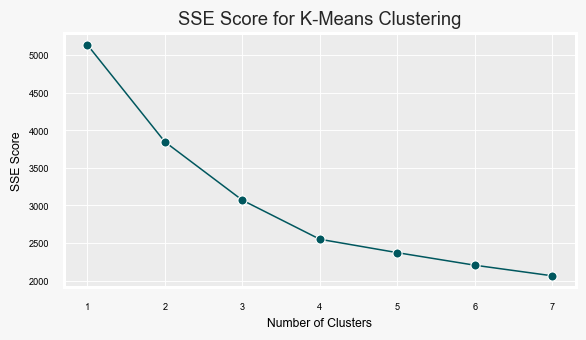

In [52]:
from sklearn.cluster import KMeans
Cluster_tuning_k_means = K_means_claster_tuning(train_df, max_cluster = 8)

with plt.rc_context(rc = {'figure.dpi': 110, 'axes.labelsize': 8, 
                          'xtick.labelsize': 6, 'ytick.labelsize': 6}):
    
    fig_8, ax_8 = plt.subplots(1, 1, figsize = (6, 3))

    sns.lineplot(x = Cluster_tuning_k_means['Cluster'].astype('int64'), 
                 y = Cluster_tuning_k_means['SSE'], color = '#00575e', 
                 marker = 'o', linewidth = 1)
    
    plt.xticks(range(1, 8))
          
    plt.xlabel('Number of Clusters')
    plt.ylabel('SSE Score')  
    plt.title('SSE Score for K-Means Clustering')  
    plt.show()

In [53]:
def K_means_clastering(df_train, Vars_list, n_clusters = 4):
    
    ### Scaling data
    
    scaler = StandardScaler()
    df_train_scaled = scaler.fit_transform(train_df)
    
    ### Initiating KMeans algorithm
    
    kmeans = KMeans(n_clusters = n_clusters, init = 'k-means++', random_state = 999)
    
    ### Getting clusters
    
    kmeans_results = kmeans.fit_predict(df_train_scaled)
    
    ### Saving results
    
    df_clusters_train = pd.DataFrame({'Cluster': kmeans_results})

    return df_clusters_train

train_df['K_means'] = K_means_clastering(train_df, Num_vars, n_clusters = 4)['Cluster']


In [54]:
train_df = train_df.dropna()


In [55]:
train_df.isna().sum()

Age                 0
Sex                 0
RestingBP           0
Cholesterol         0
MaxHR               0
Oldpeak             0
HeartDisease        0
Gaussian_mixture    0
K_means             0
dtype: int64

In [56]:
def K_means_clastering(train_df, Vars_list, n_clusters=4):
    from sklearn.cluster import KMeans
    from sklearn.preprocessing import StandardScaler
    import pandas as pd
    
    # Scaling data
    scaler = StandardScaler()
    train_df_scaled = scaler.fit_transform(train_df)
    
    # Initiating KMeans algorithm
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=999)
    
    # Getting clusters
    kmeans_results = kmeans.fit_predict(train_df_scaled)
    
    # Appending cluster labels to the dataframe
    train_df['Cluster'] = kmeans_results
    
    return train_df

# Call the function to cluster the dataframe
train_df = K_means_clastering(train_df, Num_vars, n_clusters=5)


In [57]:
train_df

,Age,Sex,RestingBP,Cholesterol,MaxHR,Oldpeak,HeartDisease,Gaussian_mixture,K_means,Cluster
477,61,0,110,0,108,2.00,1,0,3.00,2
409,53,0,160,0,122,0.00,1,0,0.00,2
448,63,0,160,230,105,1.00,1,1,2.00,3
306,55,0,115,0,155,0.10,1,0,0.00,4
172,53,0,140,320,162,0.00,0,1,1.00,1
...,...,...,...,...,...,...,...,...,...,...
71,44,0,130,215,135,0.00,0,1,1.00,1
106,48,1,120,254,110,0.00,0,3,0.00,0
270,45,0,120,225,140,0.00,0,1,1.00,1
435,60,0,152,0,118,0.00,0,0,1.00,2


In [58]:
# Memisahkan data berdasarkan klaster
cluster_1 = train_df[train_df['Cluster'] == 1]
cluster_2 = train_df[train_df['Cluster'] == 2]
cluster_3 = train_df[train_df['Cluster'] == 3]
cluster_4 = train_df[train_df['Cluster'] == 4]

# Menampilkan data di setiap klaster
print("Apa saja di Cluster 1:")
print(cluster_1)

print("\nApa saja di Cluster 2:")
print(cluster_2)

print("\nApa saja di Cluster 3:")
print(cluster_3)

print("\nApa saja di Cluster 4:")
print(cluster_4)

Apa saja di Cluster 1:
     Age  Sex  RestingBP  Cholesterol  MaxHR  Oldpeak  HeartDisease  \
172   53    0        140          320    162     0.00             0   
181   51    0        130          224    150     0.00             0   
69    44    0        150          412    170     0.00             0   
193   45    0        135          192    110     0.00             0   
169   58    0        140          179    160     0.00             0   
..   ...  ...        ...          ...    ...      ...           ...   
191   50    0        170          209    116     0.00             0   
130   38    0        145          292    130     0.00             0   
99    41    0        125          269    144     0.00             0   
71    44    0        130          215    135     0.00             0   
270   45    0        120          225    140     0.00             0   

     Gaussian_mixture  K_means  Cluster  
172                 1     1.00        1  
181                 1     3.00        1 

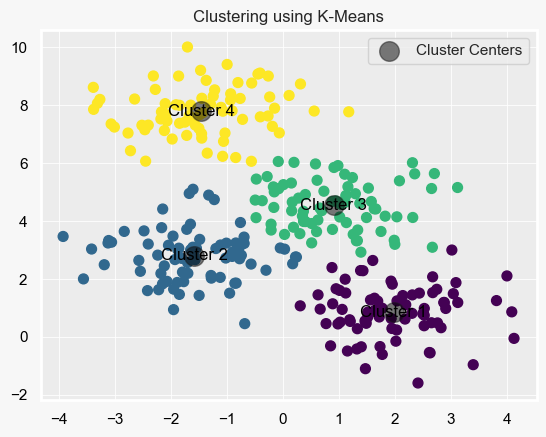

In [59]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

# Generate sample data
X, y = make_blobs(n_samples=300, centers=4, cluster_std=0.90, random_state=0)

# Function to find clusters using KMeans
def find_clusters_kmeans(X, n_clusters, rseed=0):
    kmeans = KMeans(n_clusters=n_clusters, random_state=rseed)
    labels = kmeans.fit_predict(X)
    centers = kmeans.cluster_centers_
    return centers, labels

# Find clusters using KMeans
centers_kmeans, labels_kmeans = find_clusters_kmeans(X, 4, rseed=0)

# Plot clusters using scatter plot with KMeans
plt.scatter(X[:, 0], X[:, 1], c=labels_kmeans, s=50, cmap='viridis')
plt.scatter(centers_kmeans[:, 0], centers_kmeans[:, 1], c='black', s=200, alpha=0.5, marker='o', edgecolors='k', label='Cluster Centers')
for i, center in enumerate(centers_kmeans):
    plt.annotate(f'Cluster {i+1}', center, fontsize=12, color='Black', ha='center', va='center')
plt.title('Clustering using K-Means')
plt.legend()
plt.show()


# Comparing clustering results

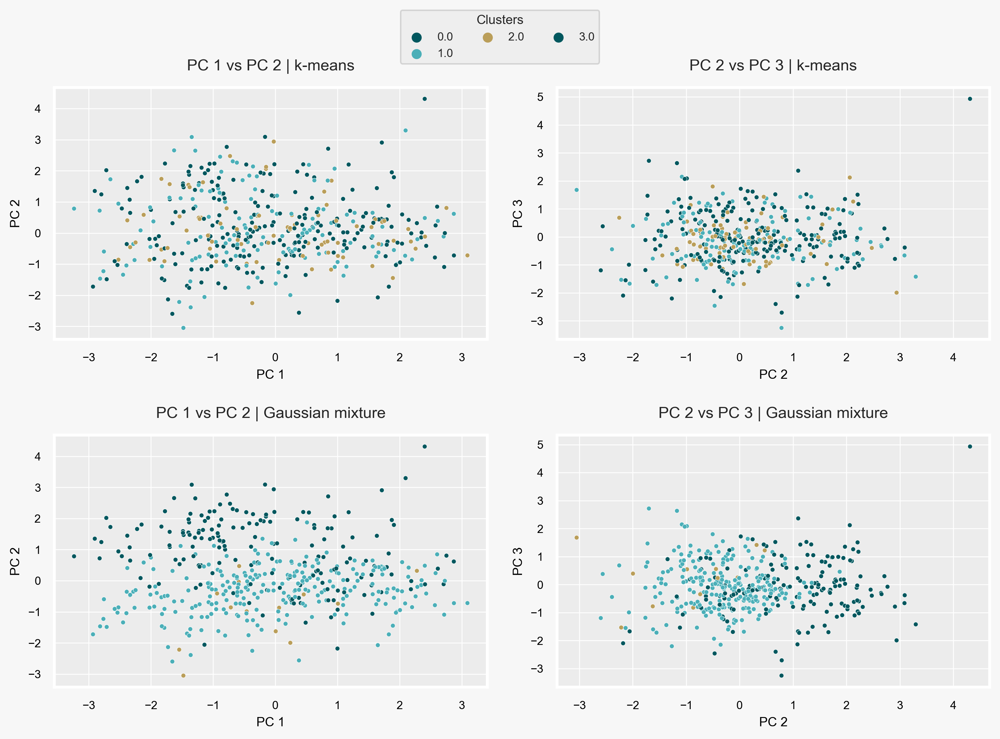

In [60]:
my_palette_2 = ['#00575e', '#4bafb8', '#ba9e59']

with plt.rc_context(rc = {'figure.dpi': 300, 'axes.labelsize': 9, 
                          'xtick.labelsize': 8, 'ytick.labelsize': 8}):
    
    fig_9, ax_9 = plt.subplots(2, 2, figsize = (10, 7))
    
    ax_9 = ax_9.flatten()
    
    ### PC 1 & PC 2 | PC 2 & PC 3 | k-means
    
    sns.scatterplot(ax = ax_9[0], x = PCA_scores['PC 1'], y = PCA_scores['PC 2'], 
                    hue = train_df['K_means'], palette = my_palette_2, s = 10)
    
    ax_9[0].get_legend().remove()
    ax_9[0].set_title('PC 1 vs PC 2 | k-means', 
                      fontsize = 11, pad = 12)
    
    sns.scatterplot(ax = ax_9[1], x = PCA_scores['PC 2'], y = PCA_scores['PC 3'], 
                    hue = train_df['K_means'], palette = my_palette_2, s = 10)
    
    ax_9[1].get_legend().remove()
    ax_9[1].set_title('PC 2 vs PC 3 | k-means', 
                      fontsize = 11, pad = 12)
    
    ### PC 1 & PC 2 | PC 2 & PC 3 | Gaussian mixture
    
    sns.scatterplot(ax = ax_9[2], x = PCA_scores['PC 1'], y = PCA_scores['PC 2'], 
                    hue = train_df['Gaussian_mixture'], palette = my_palette_2, s = 10)
    
    ax_9[2].get_legend().remove()
    ax_9[2].set_title('PC 1 vs PC 2 | Gaussian mixture', 
                      fontsize = 11, pad = 12)
    
    sns.scatterplot(ax = ax_9[3], x = PCA_scores['PC 2'], y = PCA_scores['PC 3'], 
                    hue = train_df['Gaussian_mixture'], palette = my_palette_2, s = 10)
    
    ax_9[3].get_legend().remove()
    ax_9[3].set_title('PC 2 vs PC 3 | Gaussian mixture', 
                      fontsize = 11, pad = 12)
    
    ### A global legend
    
    handles, labels = ax_9[1].get_legend_handles_labels()
    fig_9.legend(handles, labels, loc = 'upper center', 
                 bbox_to_anchor = (0.5, 1.04), ncol = 3, 
                 fontsize = 8, title = 'Clusters', title_fontsize = 9)
    
    plt.tight_layout(pad = 1.5)
    plt.show()

In [61]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Calculate silhouette score
silhouette_avg = silhouette_score(X, labels_kmeans)
print("Silhouette Score:", silhouette_avg)

# Calculate Calinski-Harabaz score
ch_score = calinski_harabasz_score(X, labels_kmeans)
print("Calinski-Harabaz Score:", ch_score)


Silhouette Score: 0.537335725464048
Calinski-Harabaz Score: 570.0768354883646


In [62]:
# Skor Silhouette
silhouette_score = 0.537335725464048
silhouette_min = -1  # Nilai minimum untuk Silhouette Score
silhouette_max = 1   # Nilai maksimum untuk Silhouette Score
silhouette_percent = (silhouette_score - silhouette_min) / (silhouette_max - silhouette_min) * 100
print("Silhouette Score (percent):", silhouette_percent)

# Skor Calinski-Harabaz
calinski_harabaz_score = 570.0768354883646
calinski_harabaz_min = 0  # Nilai minimum untuk Calinski-Harabaz Score
# Perhatikan bahwa Anda perlu menentukan nilai maksimum yang tepat berdasarkan karakteristik data Anda
# Sebagai contoh, saya akan menggunakan nilai maksimum 1000
calinski_harabaz_max = 1000  # Nilai maksimum yang mungkin
calinski_harabaz_percent = (calinski_harabaz_score - calinski_harabaz_min) / (calinski_harabaz_max - calinski_harabaz_min) * 100
print("Calinski-Harabaz Score (percent):", calinski_harabaz_percent)


Silhouette Score (percent): 76.86678627320241
Calinski-Harabaz Score (percent): 57.00768354883646


# K MEDOIDS

In [63]:
pip install scikit-learn-extra


Note: you may need to restart the kernel to use updated packages.


In [64]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import KMeans
from sklearn_extra.cluster import KMedoids
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn import datasets
from mpl_toolkits.mplot3d import Axes3D
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer

In [65]:
data = pd.read_csv("HEART.csv")


In [66]:
features  = ["Age","Sex","RestingBP", "Cholesterol", "MaxHR", "Oldpeak", "HeartDisease"]

In [67]:
data = data.dropna(subset=features)

In [68]:
# Memisahkan data menjadi train (70%) dan test (30%)
train_df, test_df = train_test_split(df, test_size=0.30, random_state=42)

In [69]:
df= data[features].copy()

In [70]:
from sklearn.model_selection import train_test_split
df_train, df_test = train_test_split(df, test_size=0.30, random_state=42)


In [71]:
df_train

,Age,Sex,RestingBP,Cholesterol,MaxHR,Oldpeak,HeartDisease
712,58,M,100,234,156,0.10,1
477,61,M,110,0,108,2.00,1
409,53,M,160,0,122,0.00,1
448,63,M,160,230,105,1.00,1
838,63,M,130,330,132,1.80,1
...,...,...,...,...,...,...,...
106,48,F,120,254,110,0.00,0
270,45,M,120,225,140,0.00,0
860,60,M,130,253,144,1.40,1
435,60,M,152,0,118,0.00,0


In [72]:
df_train['Sex'] = df_train['Sex'].replace(['M', 'F'], [0,1])
df_train.head()

,Age,Sex,RestingBP,Cholesterol,MaxHR,Oldpeak,HeartDisease
712,58,0,100,234,156,0.10,1
477,61,0,110,0,108,2.00,1
409,53,0,160,0,122,0.00,1
448,63,0,160,230,105,1.00,1
838,63,0,130,330,132,1.80,1


In [73]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 642 entries, 712 to 102
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Age           642 non-null    int64  
 1   Sex           642 non-null    int64  
 2   RestingBP     642 non-null    int64  
 3   Cholesterol   642 non-null    int64  
 4   MaxHR         642 non-null    int64  
 5   Oldpeak       642 non-null    float64
 6   HeartDisease  642 non-null    int64  
dtypes: float64(1), int64(6)
memory usage: 40.1 KB


In [74]:
pip install kneed

Note: you may need to restart the kernel to use updated packages.


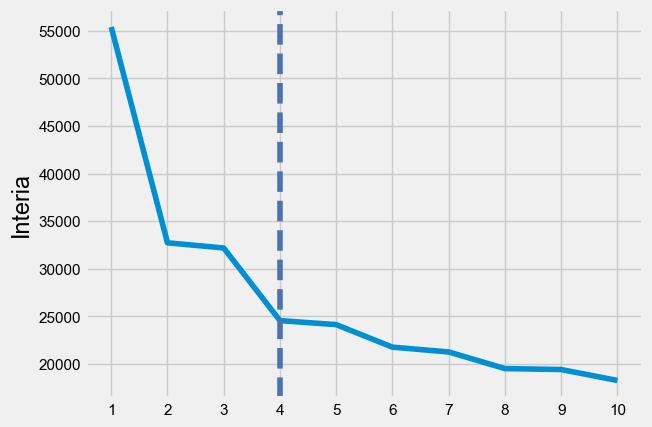

In [75]:
from sklearn_extra.cluster import KMedoids

List = []
for k in range(1,11):#this range is optional
    kmedoids = KMedoids(n_clusters=k,init= "random", random_state =5 ) 
    kmedoids.fit(df_train)
    List.append( kmedoids.inertia_)
    
from kneed import KneeLocator
kl = KneeLocator(range(1,11), List, curve='convex', direction='decreasing')
kl.elbow
plt.style.use("fivethirtyeight")
plt.plot(range(1,11),List)
plt.xticks(range(1,11))
plt.ylabel("Interia")
plt.axvline(x=kl.elbow, color='b', label='axvline - full height', ls='--')
plt.show()    

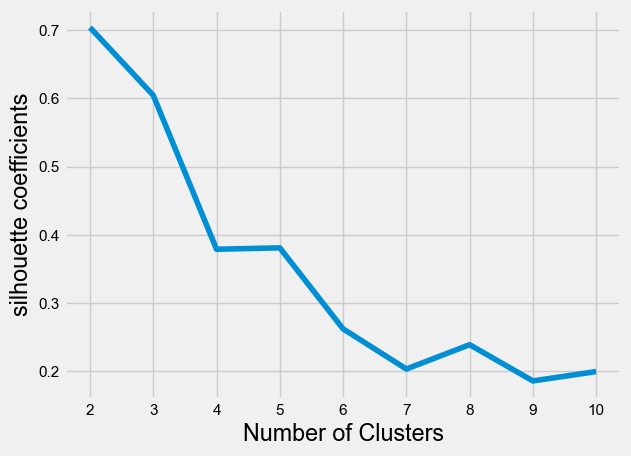

In [76]:
from sklearn.metrics import silhouette_score
from sklearn_extra.cluster import KMedoids
silhouette_coefficients = []
for k in range (2,11):
    kmedoids = KMedoids(n_clusters=k,init= "random", random_state = 5) 
    kmedoids.fit(df_train)
    score = silhouette_score(df_train, kmedoids.labels_)
    silhouette_coefficients.append(score)

plt.style.use("fivethirtyeight")
plt.plot(range(2,11), silhouette_coefficients)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("silhouette coefficients")
plt.show()

In [77]:
max(silhouette_coefficients)

0.7039762229302039

In [78]:
# Nilai minimum dan maksimum dari koefisien siluet yang mungkin
min_possible_silhouette = -1
max_possible_silhouette = 1

# Nilai maksimum koefisien siluet yang Anda temukan
max_silhouette_coefficient = max(silhouette_coefficients)  # silhouette_coefficients adalah list/array dari koefisien siluet

# Menghitung persentase relatif
percentage = ((max_silhouette_coefficient - min_possible_silhouette) / (max_possible_silhouette - min_possible_silhouette)) * 100

print("Persentase relatif dari nilai maksimum koefisien siluet: {:.2f}%".format(percentage))


Persentase relatif dari nilai maksimum koefisien siluet: 85.20%


In [79]:
from sklearn.preprocessing import StandardScaler

# Buat objek scaler
scaler = StandardScaler()

# Transformasi scaling pada fitur-fitur Anda
scaled_features = scaler.fit_transform(df_train)

# Gunakan scaled_features dalam proses clustering


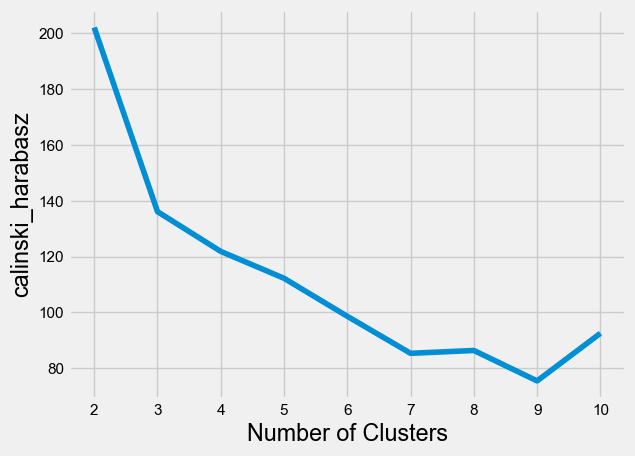

In [80]:
from sklearn import metrics
from sklearn.metrics import calinski_harabasz_score
calinski_harabaz = []
for k in range (2,11):
    kmedoids = KMedoids(n_clusters=k,init= "random", random_state = 5) 
    kmedoids.fit(scaled_features)
    metrics.calinski_harabasz_score(scaled_features, kmedoids.labels_)
    calinski_harabaz.append(metrics.calinski_harabasz_score(scaled_features, kmedoids.labels_))
plt.style.use("fivethirtyeight")
plt.plot(range(2,11), calinski_harabaz)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("calinski_harabasz")
plt.show()

In [81]:
max(calinski_harabaz)

202.16348593879985

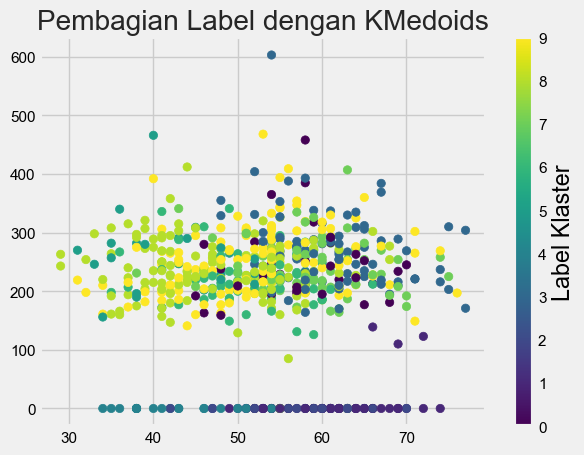

In [82]:
labels = kmedoids.labels_

# Visualisasi pembagian label
plt.scatter(df_train.iloc[:, 0], df_train.iloc[:, 3], c=labels, cmap='viridis')
plt.title('Pembagian Label dengan KMedoids')
plt.colorbar(label='Label Klaster')
plt.show()

In [83]:
# Nilai minimum dan maksimum dari indeks Calinski-Harabasz yang mungkin
min_possible_calinski_harabaz = 0  # Minimum umumnya 0
max_possible_calinski_harabaz = 1000  # Nilai maksimum yang mungkin tergantung pada data Anda

# Nilai maksimum indeks Calinski-Harabasz yang Anda temukan
max_calinski_harabaz = max(calinski_harabaz)  # calinski_harabaz adalah list/array dari nilai indeks Calinski-Harabaz

# Menghitung persentase relatif
percentage_calinski_harabaz = (max_calinski_harabaz / max_possible_calinski_harabaz) * 100

print("Persentase relatif dari nilai maksimum indeks Calinski-Harabaz: {:.2f}%".format(percentage_calinski_harabaz))


Persentase relatif dari nilai maksimum indeks Calinski-Harabaz: 20.22%


In [84]:
# Perform K-Medoids clustering
kmedoids = KMedoids(n_clusters=4, init="random", random_state=5)
kmedoids.fit(df_train)

# Get cluster labels and cluster centers
labels = kmedoids.labels_
cluster_centers = kmedoids.cluster_centers_
print("Cluster Centers:")
print(cluster_centers)

Cluster Centers:
[[5.10e+01 0.00e+00 1.32e+02 2.18e+02 1.39e+02 1.00e-01 0.00e+00]
 [6.00e+01 0.00e+00 1.20e+02 0.00e+00 1.33e+02 2.00e+00 0.00e+00]
 [5.70e+01 0.00e+00 1.40e+02 0.00e+00 1.00e+02 0.00e+00 1.00e+00]
 [5.50e+01 0.00e+00 1.40e+02 2.95e+02 1.36e+02 0.00e+00 1.00e+00]]


In [85]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 642 entries, 712 to 102
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Age           642 non-null    int64  
 1   Sex           642 non-null    int64  
 2   RestingBP     642 non-null    int64  
 3   Cholesterol   642 non-null    int64  
 4   MaxHR         642 non-null    int64  
 5   Oldpeak       642 non-null    float64
 6   HeartDisease  642 non-null    int64  
dtypes: float64(1), int64(6)
memory usage: 40.1 KB


In [86]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import pandas as pd

# Definisikan fitur numerik dan kategorikal
numeric_features = ["Age","Sex","RestingBP", "Cholesterol", "MaxHR", "HeartDisease"]
categorical_features = ["Oldpeak"]

# Buat pipelines untuk pemrosesan numerik dan kategorikal
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Gabungkan transformers
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

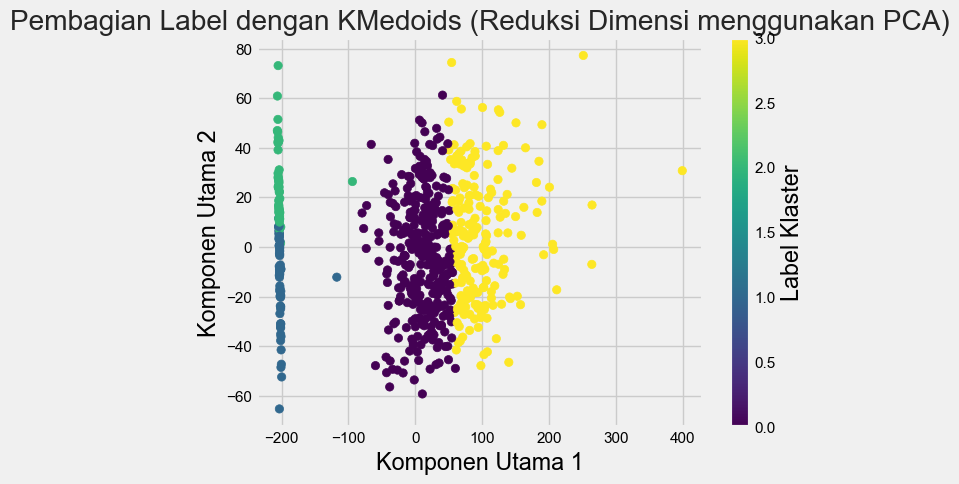

In [87]:
import matplotlib.pyplot as plt
from sklearn_extra.cluster import KMedoids
from sklearn.decomposition import PCA

# Buat objek KMedoids
kmedoids = KMedoids(n_clusters=4, init="random", random_state=5)

# Melatih model pada data
kmedoids.fit(df_train)

# Reduksi dimensi menggunakan PCA
pca = PCA(n_components=4)
df_reduced = pca.fit_transform(df_train)

# Dapatkan label klaster
labels = kmedoids.labels_

# Visualisasi pembagian label
plt.scatter(df_reduced[:, 0], df_reduced[:, 1], c=labels, cmap='viridis')
plt.title('Pembagian Label dengan KMedoids (Reduksi Dimensi menggunakan PCA)')
plt.xlabel('Komponen Utama 1')
plt.ylabel('Komponen Utama 2')
plt.colorbar(label='Label Klaster')
plt.show()


In [88]:
!pip install pywaffle

In [89]:
df_train['cluster'] = labels

In [90]:
df_train

,Age,Sex,RestingBP,Cholesterol,MaxHR,Oldpeak,HeartDisease,cluster
712,58,0,100,234,156,0.10,1,0
477,61,0,110,0,108,2.00,1,1
409,53,0,160,0,122,0.00,1,2
448,63,0,160,230,105,1.00,1,0
838,63,0,130,330,132,1.80,1,3
...,...,...,...,...,...,...,...,...
106,48,1,120,254,110,0.00,0,0
270,45,0,120,225,140,0.00,0,0
860,60,0,130,253,144,1.40,1,0
435,60,0,152,0,118,0.00,0,2


In [91]:
Count =  df_train.groupby(["cluster"], as_index=False).count()[["cluster", "Age"]]
Count.columns = ["kmedoids Cluster Labels", "Count"]
Count

,kmedoids Cluster Labels,Count
0,0,329
1,1,63
2,2,51
3,3,199


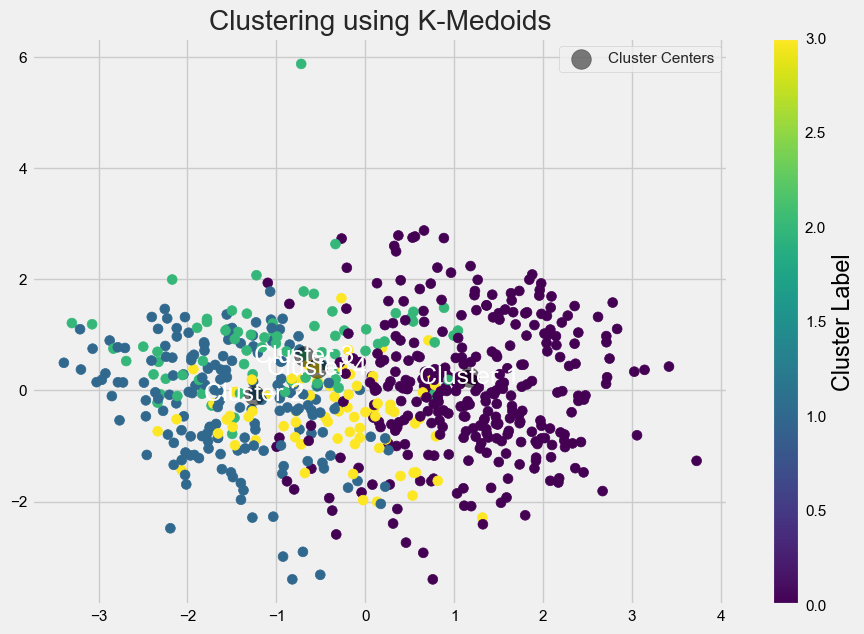

In [92]:
import matplotlib.pyplot as plt
from sklearn_extra.cluster import KMedoids
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
import pandas as pd
from sklearn.model_selection import train_test_split

# Assuming df is your DataFrame
df_train, df_test = train_test_split(df, test_size=0.30, random_state=42)

# Define numeric and categorical features
numeric_features = ["Age", "Sex", "RestingBP", "Cholesterol", "MaxHR", "HeartDisease"]
categorical_features = ["Oldpeak"]

# Convert categorical 'Sex' to numeric
df_train['Sex'] = df_train['Sex'].replace(['M', 'F'], [0, 1])
df_train.head()

# Create pipelines for numeric and categorical processing
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine transformers
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Process the training data
df_train_processed = preprocessor.fit_transform(df_train)

# Convert the processed data to a dense matrix
df_train_processed = df_train_processed.toarray()

# Function to find clusters using KMedoids
def find_clusters(df_train, n_clusters, rseed=0):
    kmedoids = KMedoids(n_clusters=n_clusters, random_state=rseed)
    labels = kmedoids.fit_predict(df_train)
    centers = kmedoids.cluster_centers_
    return centers, labels

# Find clusters
n_clusters = 4
centers, labels = find_clusters(df_train_processed, n_clusters, rseed=0)

# Reduce dimensions using PCA for visualization
pca = PCA(n_components=2)
df_train_reduced = pca.fit_transform(df_train_processed)
centers_reduced = pca.transform(centers)

# Plot clusters using scatter plot with KMedoids
plt.figure(figsize=(10, 7))
scatter = plt.scatter(df_train_reduced[:, 0], df_train_reduced[:, 1], c=labels, s=50, cmap='viridis')
plt.scatter(centers_reduced[:, 0], centers_reduced[:, 1], c='black', s=200, alpha=0.5, marker='o', edgecolors='k', label='Cluster Centers')
for i, center in enumerate(centers_reduced):
    plt.annotate(f'Cluster {i+1}', (center[0], center[1]), fontsize=18, color='White', ha='center', va='center')
plt.title('Clustering using K-Medoids')
plt.legend()
plt.colorbar(scatter, label='Cluster Label')
plt.show()


Cluster 1:
- Rentang usia pasien dalam cluster ini cukup bervariasi, mulai dari 29 hingga 70 tahun.
- Terdiri dari mayoritas pasien laki-laki.
- Tekanan darah istirahat (RestingBP) cenderung berada dalam rentang normal (di bawah 140 mmHg), tetapi ada beberapa pasien dengan tekanan darah tinggi.
- Kolesterol bervariasi, namun mayoritas berada dalam rentang normal atau sedikit meningkat.
- Detak jantung maksimum (MaxHR) mayoritas normal, meskipun ada beberapa yang rendah.
- Oldpeak cenderung rendah atau nol.
- Mayoritas pasien dalam cluster ini tidak memiliki penyakit jantung (HeartDisease=0).

Cluster 2:
- Cluster ini berisi pasien yang memiliki tekanan darah istirahat (RestingBP) yang relatif rendah, serta kolesterol yang tidak dilaporkan.
- Detak jantung maksimum (MaxHR) cenderung normal.
- Beberapa pasien memiliki Oldpeak yang negatif, menunjukkan adanya segmen ST yang menurun selama tes latihan.
- Cluster ini mayoritas berisi pasien dengan penyakit jantung (HeartDisease=1).

Cluster 3:
- Rentang usia pasien dalam cluster ini bervariasi dari 36 hingga 70 tahun.
- Mayoritas pasien adalah laki-laki.
- Tekanan darah istirahat (RestingBP) mayoritas dalam kisaran normal, namun ada beberapa pasien dengan tekanan darah tinggi.
- Kolesterol bervariasi, namun mayoritas berada dalam kisaran normal atau sedikit meningkat.
- Detak jantung maksimum (MaxHR) mayoritas normal.
- Oldpeak cenderung rendah atau nol, meskipun ada beberapa nilai yang tinggi.
- Sebagian besar pasien dalam cluster ini memiliki penyakit jantung (HeartDisease=1).

Cluster 4:
- Rentang usia pasien dalam cluster ini bervariasi dari 41 hingga 70 tahun.
- Mayoritas pasien adalah laki-laki.
- Tekanan darah istirahat (RestingBP) bervariasi, dengan beberapa pasien memiliki tekanan darah tinggi.
- Kolesterol bervariasi, namun mayoritas berada dalam kisaran normal atau sedikit meningkat.
- Detak jantung maksimum (MaxHR) mayoritas normal.
- Oldpeak cenderung rendah atau nol, meskipun ada beberapa nilai yang tinggi.
- Sebagian besar pasien dalam cluster ini tidak memiliki penyakit jantung (HeartDisease=0), namun ada beberapa yang menderita penyakit jantung.

# RANDOM FOREST

----

In [99]:
df_train

,Age,Sex,RestingBP,Cholesterol,MaxHR,Oldpeak,HeartDisease
712,58,0,100,234,156,0.10,1
477,61,0,110,0,108,2.00,1
409,53,0,160,0,122,0.00,1
448,63,0,160,230,105,1.00,1
838,63,0,130,330,132,1.80,1
...,...,...,...,...,...,...,...
106,48,1,120,254,110,0.00,0
270,45,0,120,225,140,0.00,0
860,60,0,130,253,144,1.40,1
435,60,0,152,0,118,0.00,0


In [100]:
df_test

,Age,Sex,RestingBP,Cholesterol,MaxHR,Oldpeak,HeartDisease
668,63,F,140,195,179,0.00,0
30,53,M,145,518,130,0.00,1
377,65,M,160,0,122,1.20,1
535,56,M,130,0,122,1.00,1
807,54,M,108,309,156,0.00,0
...,...,...,...,...,...,...,...
133,56,M,150,230,124,1.50,1
813,69,F,140,239,151,1.80,0
734,56,M,130,283,103,1.60,1
360,62,M,160,0,72,0.00,1


In [133]:
# Random forest

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline


# Import Classified Data
df_test.head()




,Age,Sex,RestingBP,Cholesterol,MaxHR,Oldpeak,HeartDisease
668,63,F,140,195,179,0.00,0
30,53,M,145,518,130,0.00,1
377,65,M,160,0,122,1.20,1
535,56,M,130,0,122,1.00,1
807,54,M,108,309,156,0.00,0


In [134]:
features  = ["Age","Sex","MaxHR","HeartDisease"]
df_test = df_test.dropna(subset=features)
df1= df_test[features].copy()
df1

,Age,Sex,MaxHR,HeartDisease
668,63,F,179,0
30,53,M,130,1
377,65,M,122,1
535,56,M,122,1
807,54,M,156,0
...,...,...,...,...
133,56,M,124,1
813,69,F,151,0
734,56,M,103,1
360,62,M,72,1


In [143]:
df1.isna().sum()

Age             0
Sex             0
MaxHR           0
HeartDisease    0
dtype: int64

In [136]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)


In [138]:
from sklearn.model_selection import train_test_split, KFold, LeaveOneOut, cross_val_score
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import itertools
# Pelatihan Model menggunakan LOOCV
loo = LeaveOneOut()
loo_accuracies = cross_val_score(model, X_train, y_train, cv=10)
print("Mean LOOCV Accuracy:", loo_accuracies.mean())

Mean LOOCV Accuracy: 0.9596837944664032


In [139]:
# Evaluasi Model dengan Data Pengujian
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print("Test Set Accuracy:", accuracy)
print("Classification Report:\n", report)

Test Set Accuracy: 0.92
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.88      0.88        24
           1       0.92      1.00      0.96        12
           2       0.95      0.95      0.95        21
           3       0.94      0.89      0.91        18

    accuracy                           0.92        75
   macro avg       0.92      0.93      0.93        75
weighted avg       0.92      0.92      0.92        75



In [140]:
df1

,Age,Sex,MaxHR,HeartDisease
668,63,F,179,0
30,53,M,130,1
377,65,M,122,1
535,56,M,122,1
807,54,M,156,0
...,...,...,...,...
133,56,M,124,1
813,69,F,151,0
734,56,M,103,1
360,62,M,72,1


K-Fold Cross Validation Accuracies: [0.71428571 0.73809524 0.58536585 0.7804878  0.63414634]
Mean K-Fold Cross Validation Accuracy: 0.6904761904761906
Test Set Accuracy: 0.5797101449275363
Classification Report:
               precision    recall  f1-score   support

           0       0.48      0.46      0.47        28
           1       0.64      0.66      0.65        41

    accuracy                           0.58        69
   macro avg       0.56      0.56      0.56        69
weighted avg       0.58      0.58      0.58        69

Confusion Matrix:
 [[13 15]
 [14 27]]
Confusion matrix, without normalization
[[13 15]
 [14 27]]


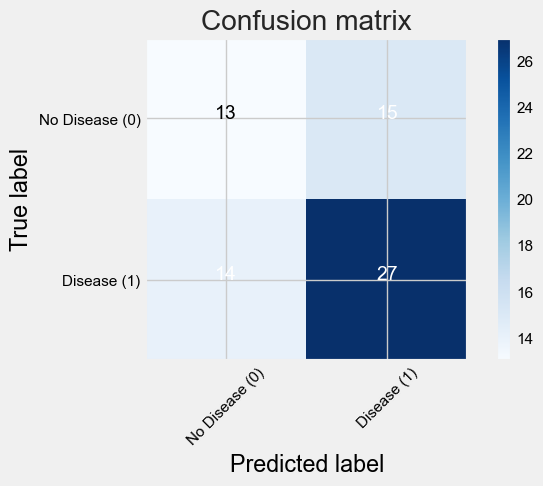

In [141]:
# Label Encoding untuk kolom 'Sex'
le = LabelEncoder()
df1['Sex'] = le.fit_transform(df1['Sex'])

# Pemilihan Fitur untuk klasifikasi Age dan MaxHR
features = ['Age','MaxHR']
X = df1[features]
y = df1['HeartDisease']

# Pembagian Data
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

# Inisialisasi Model Klasifikasi
model = RandomForestClassifier(n_estimators=100, random_state=42)

# Pelatihan Model menggunakan K-Fold Cross Validation
kfold = KFold(n_splits=5, shuffle=True, random_state=42)
kfold_accuracies = cross_val_score(model, X_train, y_train, cv=kfold)
print("K-Fold Cross Validation Accuracies:", kfold_accuracies)
print("Mean K-Fold Cross Validation Accuracy:", kfold_accuracies.mean())

# Pelatihan Model menggunakan data pelatihan
model.fit(X_train, y_train)

# Evaluasi Model dengan Data Pengujian
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print("Test Set Accuracy:", accuracy)
print("Classification Report:\n", report)

# Confusion Matrix
cnf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cnf_matrix)

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
   
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['No Disease (0)', 'Disease (1)'],
                      normalize=False, title='Confusion matrix')

plt.show()

In [142]:
features  = ["Age","Sex","MaxHR","HeartDisease"]
df_train = df_train.dropna(subset=features)
df2= df_train[features].copy()
df2

,Age,Sex,MaxHR,HeartDisease
712,58,0,156,1
477,61,0,108,1
409,53,0,122,1
448,63,0,105,1
838,63,0,132,1
...,...,...,...,...
106,48,1,110,0
270,45,0,140,0
860,60,0,144,1
435,60,0,118,0


In [148]:
df2.isna().sum()

Age             0
Sex             0
MaxHR           0
HeartDisease    0
dtype: int64

In [149]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)


K-Fold Cross Validation Accuracies: [0.69072165 0.61458333 0.6875     0.64583333 0.61458333]
Mean K-Fold Cross Validation Accuracy: 0.6506443298969072
Test Set Accuracy: 0.5900621118012422
Classification Report:
               precision    recall  f1-score   support

           0       0.52      0.59      0.55        69
           1       0.66      0.59      0.62        92

    accuracy                           0.59       161
   macro avg       0.59      0.59      0.59       161
weighted avg       0.60      0.59      0.59       161

Confusion Matrix:
 [[41 28]
 [38 54]]
Confusion matrix, without normalization
[[41 28]
 [38 54]]


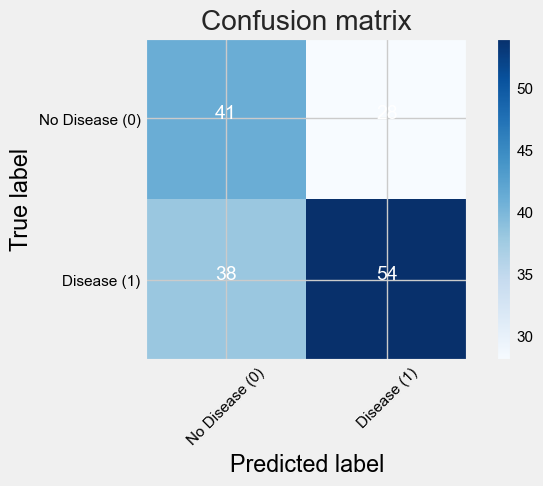

In [150]:
# Label Encoding untuk kolom 'Sex'
le = LabelEncoder()
df2['Sex'] = le.fit_transform(df2['Sex'])

# Pemilihan Fitur untuk klasifikasi Age dan MaxHR
features = ['Age','MaxHR']
X = df2[features]
y = df2['HeartDisease']

# Pembagian Data
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

# Inisialisasi Model Klasifikasi
model = RandomForestClassifier(n_estimators=100, random_state=42)

# Pelatihan Model menggunakan K-Fold Cross Validation
kfold = KFold(n_splits=5, shuffle=True, random_state=42)
kfold_accuracies = cross_val_score(model, X_train, y_train, cv=kfold)
print("K-Fold Cross Validation Accuracies:", kfold_accuracies)
print("Mean K-Fold Cross Validation Accuracy:", kfold_accuracies.mean())

# Pelatihan Model menggunakan data pelatihan
model.fit(X_train, y_train)

# Evaluasi Model dengan Data Pengujian
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print("Test Set Accuracy:", accuracy)
print("Classification Report:\n", report)

# Confusion Matrix
cnf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cnf_matrix)

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
   
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['No Disease (0)', 'Disease (1)'],
                      normalize=False, title='Confusion matrix')

plt.show()